<a href="https://colab.research.google.com/github/ccg-esb/EvK/blob/main/py_pOXA48_SI6_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import numpy as np
import os
import csv
import sys
import matplotlib.pyplot as plt
import colorcet as cc
import time
import multiprocessing
import random
from tabulate import tabulate
import itertools
import pickle
from collections import Counter
import seaborn as sns

In [3]:
from google.colab import drive
drive.mount('/content/drive')

root='/content/drive/MyDrive/SYNC_Projects/pOXA48/2023/code/py-files/'
os.chdir(root)

Mounted at /content/drive



## __SI:__ Antimicrobial resistance level and conjugation permissiveness shape plasmid distribution in clinical enterobacteria

###6. Visualizing computer experiments of multistrain communities

This notebook is dedicated to the analysis and visualization of the data obtained from the numerical experiments conducted on multistrain bacterial communities. Having previously performed simulations to understand the stability of plasmids within these communities, we've collected data that represents a wide range of environmental conditions and community structures. The information provides insights into the plasmid's distribution across different strains under varying antibiotic concentrations, reflecting the complex interplay between antibiotic resistance, plasmid transfer rates, and community dynamics.

In this section, we will visualize the results of these computer experiments to draw meaningful interpretations and make inferences. Using various graphical representations, we'll dissect the influence of two key parameters: the strength of selection and the population structure. The strength of selection is analyzed through the lens of varying antibiotic concentrations, while population structure is considered through the diversity of strains present in the community.

Through these visualizations, we aim to better understand the conditions that enable plasmid stability, reveal the impact of population structure and antibiotic pressure on this stability, and assess the probability of establishing successful plasmid-host relationships under different environmental pressures.

### Model parameters

In [4]:
sys.path.insert(0, 'src/')
from pOXA48_S1 import *
from pOXA48_S2 import *
from pOXA48_S3 import *

%run src/pOXA48_parameters
print_expe_params(expe_params)



Experimental Parameters:
------------------------------------------------
	Initial bacterial density (B0): 1000000.0
	Maximum drug concentration (A_max): 131072
	Antibiotic degradation rates (alphas): [1.e-10 1.e-12]
	Length of experiment (T): 24
	Initial resource concentration (S0): 1.0
	Resource decay rate (d): 0.1
	Extinction threshold: 1.0
------------------------------------------------


In [5]:

model_params = import_model_params("%smodel_params.csv"%(dataPath), expe_params)
display_model_params_stats(model_params, strains_subset)


╒═════════╤═════════════╤═══════════════════════╤═════════════════════════════════╤═════╕
│ Group   │ Parameter   │ Mean                  │ Range                           │ N   │
╞═════════╪═════════════╪═══════════════════════╪═════════════════════════════════╪═════╡
│ E-TC    │ conj_rate   │ nan                   │ (nan, nan)                      │ 10  │
├─────────┼─────────────┼───────────────────────┼─────────────────────────────────┼─────┤
│ E-TC    │ VKm         │ 5.931e-10             │ (3.79e-10, 7.6e-10)             │ 10  │
├─────────┼─────────────┼───────────────────────┼─────────────────────────────────┼─────┤
│ E-TC    │ rho         │ 948158352.0           │ (550386500.0, 1121715175.0)     │ 10  │
├─────────┼─────────────┼───────────────────────┼─────────────────────────────────┼─────┤
│ E-TC    │ seg_rate    │ 0.0020000000000000005 │ (0.002, 0.002)                  │ 10  │
├─────────┼─────────────┼───────────────────────┼─────────────────────────────────┼─────┤
│ E-TC    

### Experiment parameters

In [6]:
num_days = 10
num_experiments = 100

M_values=range(1,len(strains_subset)+1)
powers = np.arange(-4.0,20.0)  # array of powers of two exponents
Amax_values=np.power(2, powers)  # calculate 2 raised to each exponent
verbose=False


runPathN = path+'runs/N'+str(num_days)+'/'
print("runPath=%s"%runPathN)


runPath=./runs/N10/


In [7]:
def get_sequences_from_files(directory, length=None):
    """
    Extracts sequences of integers from the names of the files in a directory.

    This function looks for files with names that start with "sim_Es_" and end with ".pkl", then
    extracts a sequence of integers from the rest of the filename. It assumes that the integers
    are separated by underscores.

    Parameters:
    directory: str
        The path to the directory containing the files.
    length: int, optional
        The length of the sequences to look for. If specified, only sequences of this length are returned.
        If not specified, sequences of any length are returned.

    Returns:
    sequences: list of lists
        A list of the sequences that were found. Each sequence is represented as a list of integers.
    """
    sequences = []

    for filename in os.listdir(directory):
        if filename.startswith("sim_Es_") and filename.endswith(".pkl"):
            sequence = filename[len("sim_Es_"):-len(".pkl")]
            sequence = list(map(int, sequence.split('_')))

            if length is None or len(sequence) == length:
                sequences.append(sequence)

    return sequences


In [8]:
from datetime import datetime
import math

def get_update_simulations(runPathN, str_E, num_days, Amax_values, length=20):
    """
    Count the number of simulations performed for each drug concentration.

    This function looks in the directories corresponding to each drug concentration
    and counts the number of files that start with "sim_Es_" and end with ".pkl".

    Parameters:
    runPathN: str
        The path to the parent directory containing the drug concentration directories.
    str_E: str
        String representing the drug effect.
    num_days: int
        The number of days for which the simulations were run.
    Amax_values: list
        List of drug concentrations.
    length: int, optional
        The length of the sequences to count. Default is 20.

    Returns:
    counts: dict
        A dictionary where each key is a drug concentration and each value is a tuple.
        The first element of the tuple is the total number of simulations and the second element
        is the number of simulations that produced sequences of the specified length.
    """
    counts = {}

    for Amax in Amax_values:
        # Construct the path to the directory where the data is stored
        directory = '%s/%s_N%s_A%se-2/' % (runPathN, str_E, num_days, int(100*Amax))

        # Get the sequences from the files in the directory
        all_sequences = get_sequences_from_files(directory)
        length_sequences = get_sequences_from_files(directory, length=length)

        # Count the number of sequences
        counts[Amax] = (len(all_sequences), len(length_sequences))

    # Get the current date and time
    now = datetime.now()

    print(f"Number of simulations performed at {now.strftime('%Y-%m-%d %H:%M')}:\n")

    return counts

# Get the status of the simulations
status_simulations = get_update_simulations(runPathN, str_E, num_days, Amax_values)

df = pd.DataFrame.from_records(
    [(math.log2(Amax), total, length_20) for Amax, (total, length_20) in status_simulations.items()],
    columns=["Drug Concentration (log2)", "#Simulations", "#Completed"],
    index="Drug Concentration (log2)"
)
print(df)

Number of simulations performed at 2023-07-17 13:04:

                           #Simulations  #Completed
Drug Concentration (log2)                          
-4.0                               1918         100
-3.0                               1933         100
-2.0                               1910         100
-1.0                               1909         100
 0.0                               1923         100
 1.0                               1945         101
 2.0                               2860         151
 3.0                               2316         122
 4.0                               2595         137
 5.0                               2430         128
 6.0                               2438         128
 7.0                               2109         109
 8.0                               1915         100
 9.0                               1921         100
 10.0                              1907         100
 11.0                              2445         127
 12.0     

## Load & Plot

In [8]:
def load_simulation_results(filename):
    """
    Loads previously saved simulation results from a pickle file.

    Parameters:
    filename: str
        The name of the file from which to load the simulation results.

    Returns:
    tuple
        The simulation results loaded from the file, including istrains, Es, Btot, BpEs, BpKs, BfEs, BfKs, freqpEs, freqpKs, ts, ys, params.
    """

    # Open the file in binary mode for reading
    with open(filename, "rb") as f:
        # Load the contents of the file using pickle
        results = pickle.load(f)

    # Return the contents of the file as a tuple of values
    return results["istrains"], results["Es"],  results["Btot"], results["BpEs"], results["BpKs"], results["BfEs"], results["BfKs"], results["freqpEs"], results["freqpKs"], results["ts"], results["ys"], results["params"]


These functions are designed to load the simulation results for different drug concentrations (stored in Amax_values) and plot the final bacterial densities for different concentrations.

In [9]:
def load_and_plot_As(M, Amax_values, save_path='', verbose=False):
    """
    Loads and plots data for various drug concentrations.

    Parameters:
    M: int
        Maximum number of strains to consider.
    Amax_values: list
        List of drug concentrations to consider.
    verbose: bool, optional
        If True, print verbose output about data loading.
    """

    # Lists to store data across all experiments
    expe_Btots = []
    expe_BpEs = []
    expe_BpKs = []
    expe_BfEs = []
    expe_BfKs = []
    expe_As = []

    # Iterate over each drug concentration
    for Amax in Amax_values:
        # Construct the path to the directory where the data is stored
        runPath = '%s/%s_N%s_A%se-2/' % (runPathN, str_E, num_days, int(100*Amax))

        # Check if the directory exists, and if not, skip this drug concentration
        if not os.path.isdir(runPath):
            print(f"Directory {runPath} does not exist. Skipping.")
            continue

        # Load sequences from the files in the directory
        expe_istrains = get_sequences_from_files(runPath, length=len(strains_subset))

        # Iterate over each subset of strains
        for iexpe in range(1, len(expe_istrains)):
            # Get the current subset of strains and truncate to the maximum number of strains
            this_istrains = expe_istrains[iexpe][:M]

            # Convert strains to strings and join into a single string for the filename
            sim_lbl = "_".join(map(str, this_istrains))
            fileName = "sim_Es_%s.pkl" % sim_lbl

            # Construct the path to the file
            filePath = "%s%s" % (runPath, fileName)

            # Check if the file exists
            if os.path.isfile(filePath):
                # Load simulation results from the file
                this_subset, this_Es, this_Btot, this_BpEs, this_BpKs, this_BfEs, this_BfKs, this_freqpEs, this_freqpKs, this_ts, this_ys, this_params  = load_simulation_results(filePath)

                # If verbose output is desired, print the file path
                if verbose:
                    print("%s: Loading %s" % (iexpe, filePath))

                # Iterate over each strain in the subset and append data to the lists
                for j in range(len(this_Btot)):
                    expe_Btots.append(this_Btot[j][-1])  # last value of Btot
                    expe_BpEs.append(this_BpEs[j][-1])  # last value of BpEs
                    expe_BpKs.append(this_BpKs[j][-1])  # last value of BpKs
                    expe_BfEs.append(this_BfEs[j][-1])  # last value of BfEs
                    expe_BfKs.append(this_BfKs[j][-1])  # last value of BfKs
                    expe_As.append(Amax)  # associated drug concentration
            else:
                # If the file does not exist and verbose output is desired, print a message
                if verbose:
                    print("Not found %s" % (filePath))

    # Once all data has been loaded, plot the results
    plot_final_fraction_As(expe_As, expe_Btots, expe_BpEs, expe_BpKs, expe_BfEs, expe_BfKs, M, save_path)



def plot_final_fraction_As(expe_As, expe_Btots, expe_BpEs, expe_BpKs, expe_BfEs, expe_BfKs, M, save_path):
    """
    Plots the final bacterial densities against drug concentrations.

    Parameters:
    expe_As: list
        List of drug concentrations.
    expe_Btots: list
        List of total bacterial densities at the end of each simulation.
    expe_BpEs: list
        List of final densities of bacteria with E plasmids.
    expe_BpKs: list
        List of final densities of bacteria with K plasmids.
    expe_BfEs: list
        List of final densities of free E plasmids.
    expe_BfKs: list
        List of final densities of free K plasmids.
    M: int
        The maximum number of strains.
    """

    jitter = 0.017  # Amount of jitter to add to the x-values

    # Create a jittered version of the drug concentration values
    expe_As_jittered = expe_As + np.random.uniform(-jitter, jitter, size=len(expe_As))

    # Create scatter plots of the bacterial densities against drug concentration
    plt.scatter(expe_As_jittered, expe_Btots, alpha=0.01, color='black', label='Btots')
    plt.scatter(expe_As_jittered, expe_BpEs, alpha=0.01, color='red', label='BpEs')
    plt.scatter(expe_As_jittered, expe_BpKs, alpha=0.01, color='blue', label='BpKs')

    # Calculate the mean bacterial densities for each unique drug concentration
    unique_As = np.unique(expe_As)
    mean_Btots = [np.mean(np.array(expe_Btots)[np.array(expe_As) == A]) for A in unique_As]
    mean_BpEs = [np.mean(np.array(expe_BpEs)[np.array(expe_As) == A]) for A in unique_As]
    mean_BpKs = [np.mean(np.array(expe_BpKs)[np.array(expe_As) == A]) for A in unique_As]

    # Plot the mean bacterial densities
    plt.plot(unique_As, mean_Btots, color='black')
    plt.plot(unique_As, mean_BpEs, color='red')
    plt.plot(unique_As, mean_BpKs, color='blue')

    # Set labels and title
    plt.xlabel('Drug concentration (log2)', fontsize=16)
    plt.ylabel('Bacterial density', fontsize=16)
    plt.title('M=%s' % (M))
    ax = plt.gca()
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)
    plt.xscale('log', base=2)
    plt.legend()

    if save_path:
      plt.savefig(save_path)
      print("Exporting %s"%save_path)

    plt.show()



Exporting ./runs/N10/expe_N10_dose_v_density_M1.pdf


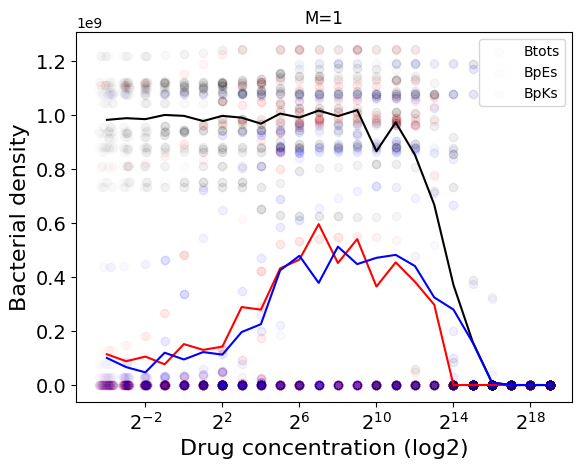

Exporting ./runs/N10/expe_N10_dose_v_density_M2.pdf


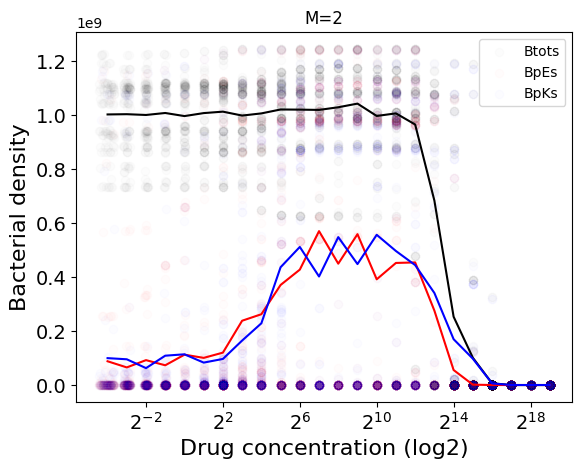

Exporting ./runs/N10/expe_N10_dose_v_density_M3.pdf


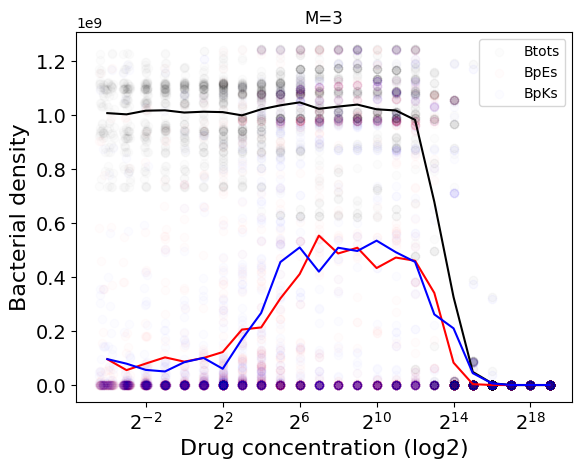

Exporting ./runs/N10/expe_N10_dose_v_density_M4.pdf


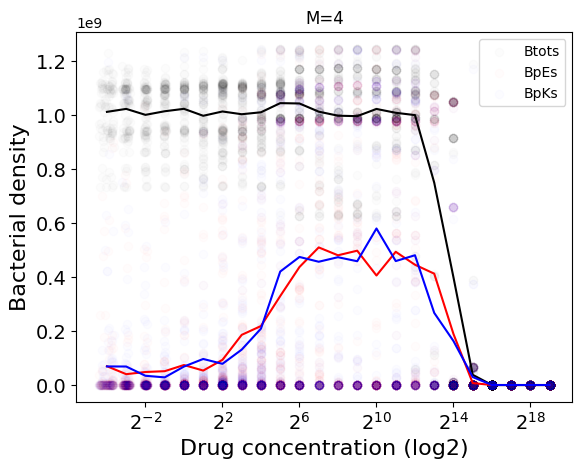

Exporting ./runs/N10/expe_N10_dose_v_density_M5.pdf


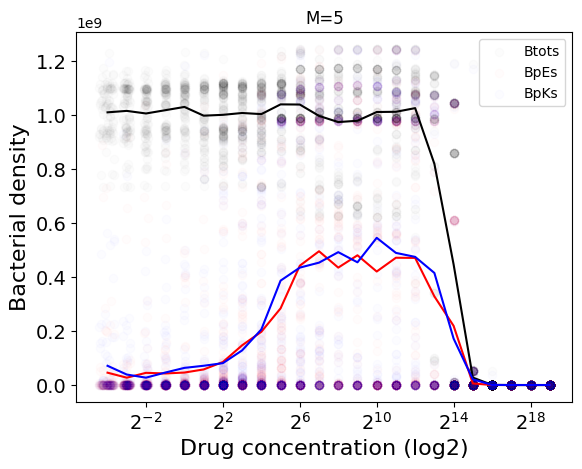

Exporting ./runs/N10/expe_N10_dose_v_density_M6.pdf


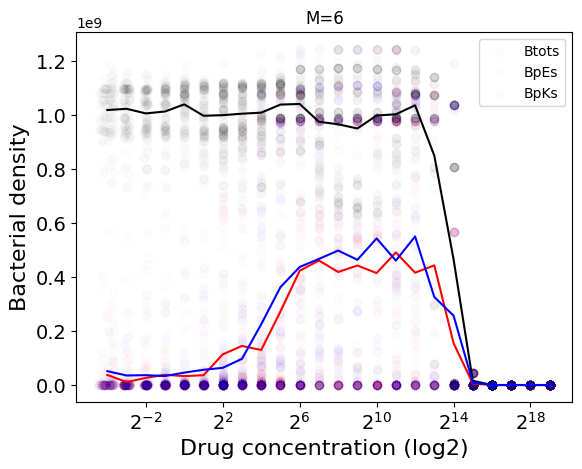

Exporting ./runs/N10/expe_N10_dose_v_density_M7.pdf


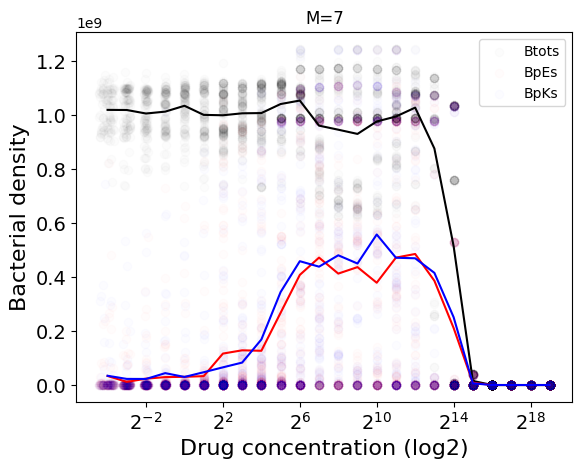

Exporting ./runs/N10/expe_N10_dose_v_density_M8.pdf


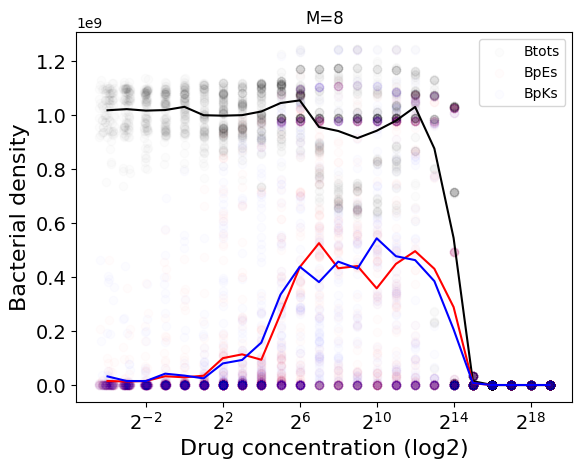

Exporting ./runs/N10/expe_N10_dose_v_density_M9.pdf


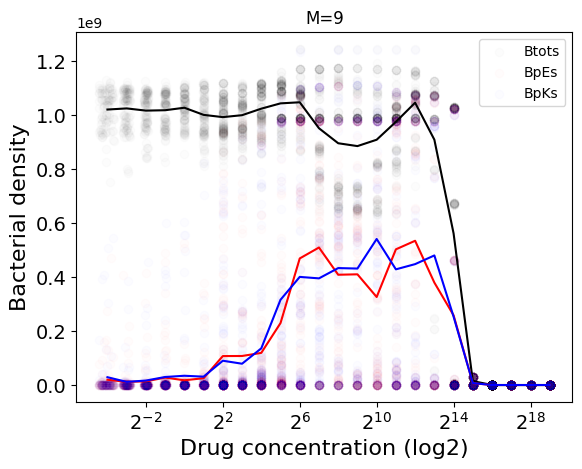

Exporting ./runs/N10/expe_N10_dose_v_density_M10.pdf


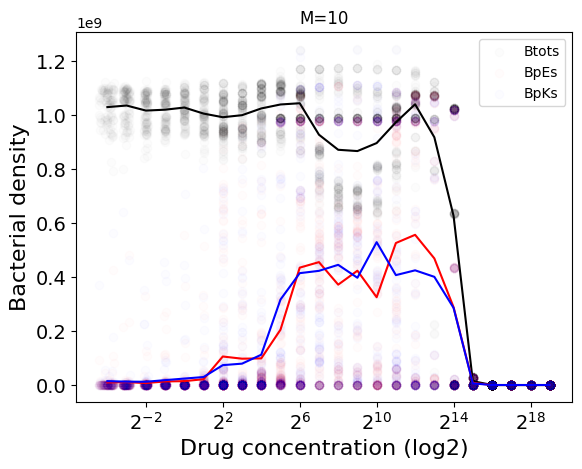

Exporting ./runs/N10/expe_N10_dose_v_density_M11.pdf


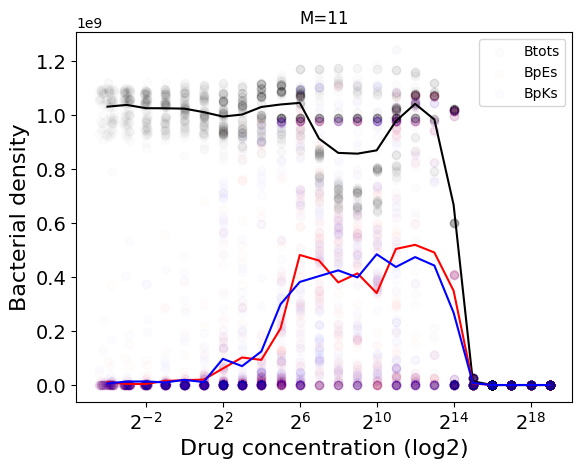

Exporting ./runs/N10/expe_N10_dose_v_density_M12.pdf


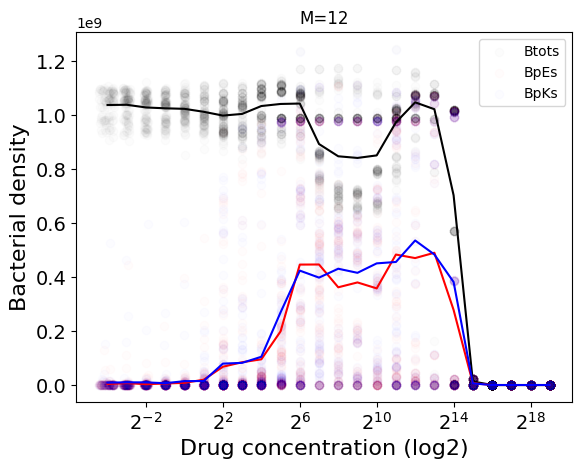

Exporting ./runs/N10/expe_N10_dose_v_density_M13.pdf


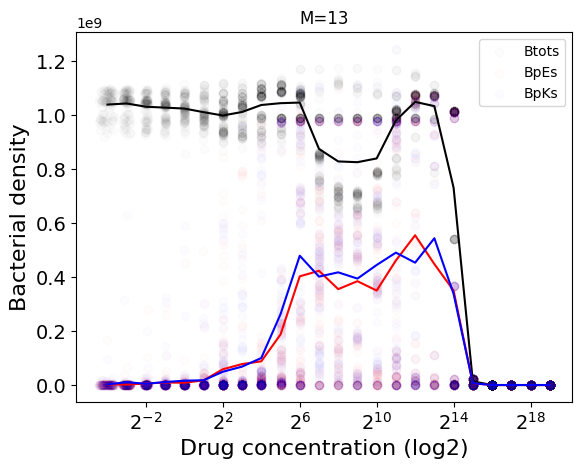

Exporting ./runs/N10/expe_N10_dose_v_density_M14.pdf


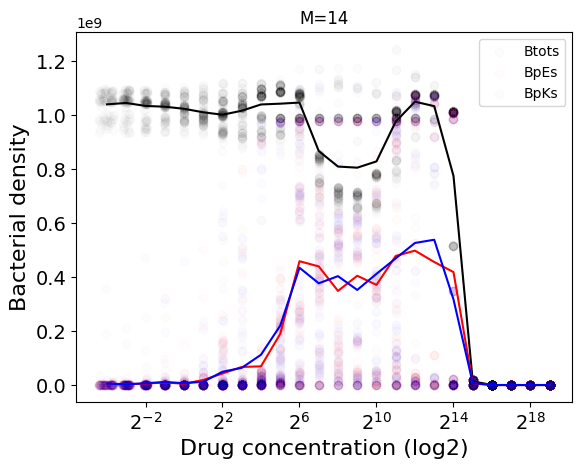

Exporting ./runs/N10/expe_N10_dose_v_density_M15.pdf


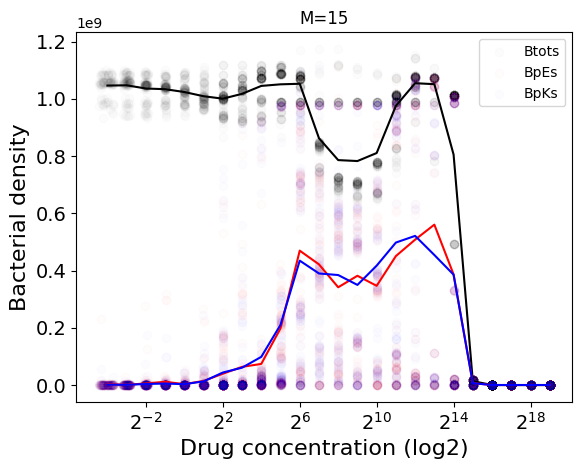

Exporting ./runs/N10/expe_N10_dose_v_density_M16.pdf


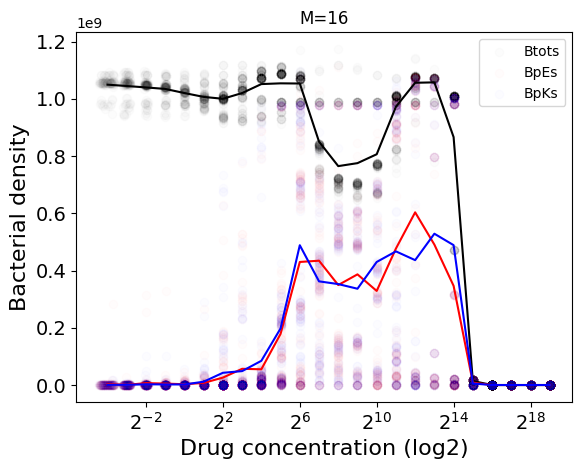

Exporting ./runs/N10/expe_N10_dose_v_density_M17.pdf


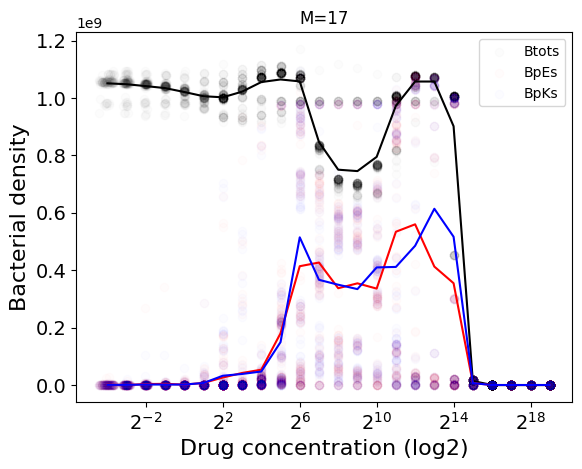

Exporting ./runs/N10/expe_N10_dose_v_density_M18.pdf


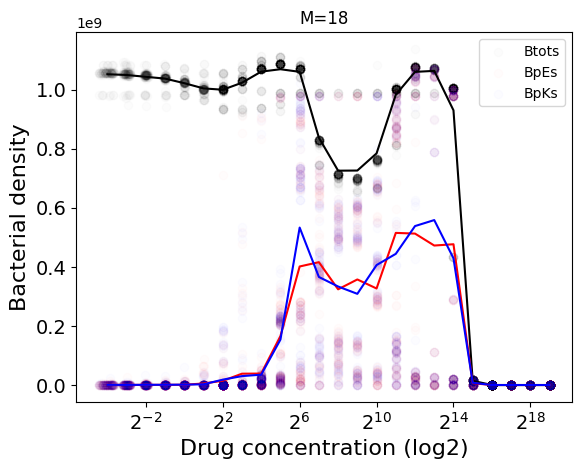

Exporting ./runs/N10/expe_N10_dose_v_density_M19.pdf


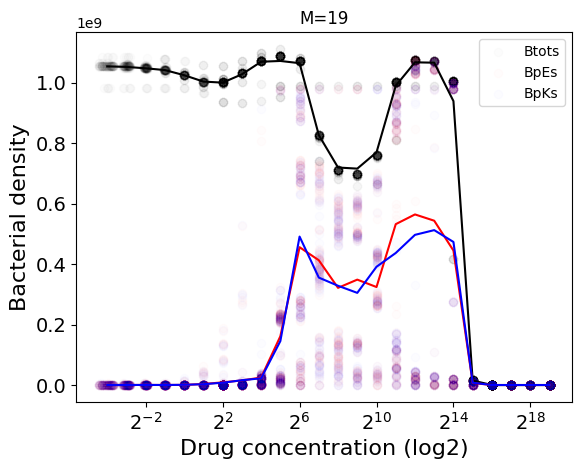

Exporting ./runs/N10/expe_N10_dose_v_density_M20.pdf


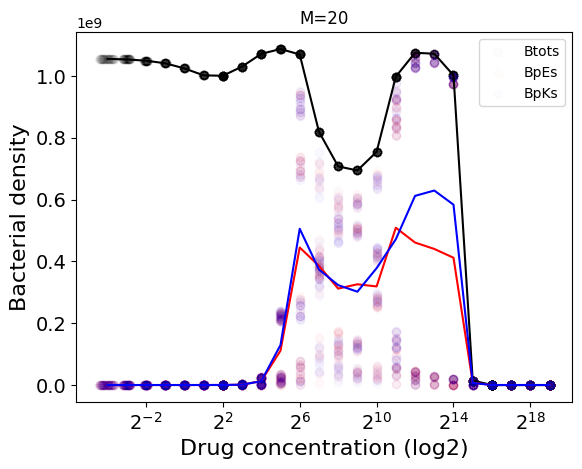

In [10]:
for M in M_values:
  save_path="%sexpe_N%s_dose_v_density_M%s.pdf"%(runPathN, num_days, M)
  load_and_plot_As(M, Amax_values, save_path, verbose=False)

The following function loads simulation results corresponding to different experimental conditions determined by the drug concentrations (Amax_values) and a the number of strains in the population (M). For each simulation, it calculates the final frequencies of plasmid-bearing bacteria relative to the total bacterial density. The function then plots these final frequencies as a function of drug concentration.

In [30]:
def load_and_plot_A_v_PF(M, Amax_values, verbose=False):
    """
    Loads simulation results from the file and plots the final plasmid frequencies against drug concentrations.

    Parameters:
    M: int
        The maximum number of strains.
    Amax_values: list
        List of drug concentrations.
    verbose: bool, optional
        If True, the function prints additional debug information.
    """

    # Lists to hold results
    expe_Amaxs = []  # drug concentrations
    expe_PF_Es = []  # final frequencies of bacteria with E plasmids
    expe_PF_Ks = []  # final frequencies of bacteria with K plasmids
    expe_PF_total = []  # total final frequencies of bacteria with plasmids

    # For each drug concentration
    for Amax in Amax_values:
        # Construct the path to the results directory
        runPath = '%s%s_N%s_A%se-2/' % (runPathN, str_E, num_days, int(Amax*100))

        # If the directory doesn't exist, print a message and skip this concentration
        if not os.path.isdir(runPath):
            print(f"Directory {runPath} does not exist. Skipping.")
            continue

        # Load the sequences of strains from the files in the directory
        expe_istrains = get_sequences_from_files(runPath, length=len(strains_subset))

        # For each sequence of strains
        for iexpe in range(1, len(expe_istrains)):
            # Take the first M strains from the sequence
            this_istrains = expe_istrains[iexpe][:M]

            # Construct the filename of the results file for this sequence
            sim_lbl = "_".join(str(x) for x in this_istrains)  # Join elements with "_"
            fileName = "sim_Es_%s.pkl" % sim_lbl  # Construct the filename
            filePath = "%s%s" % (runPath, fileName)

            # If the results file exists
            if os.path.isfile(filePath):

                # Load the simulation results from the file
                this_subset, this_Es, this_Btot, this_BpEs, this_BpKs, this_BfEs, this_BfKs, this_freqpEs, this_freqpKs, this_ts, this_ys, this_params  = load_simulation_results(filePath)

                # Print a message if verbose is True
                if verbose:
                    print("%s: Loading %s" % (iexpe, filePath))

                # For each simulation run in the results
                for j in range(len(this_Btot)):
                    # Get the final densities of bacteria with E and K plasmids, and free E and K plasmids
                    final_BpEs = this_BpEs[j][-1]
                    final_BpKs = this_BpKs[j][-1]
                    final_BfEs = this_BfEs[j][-1]
                    final_BfKs = this_BfKs[j][-1]

                    # Calculate the total final density
                    final_density = this_Btot[j][-1]

                    # If the total final density is above a threshold
                    if final_density > 1e-6:
                        # Calculate the final frequencies of bacteria with E and K plasmids
                        final_pf_Es = final_BpEs / final_density
                        final_pf_Ks = final_BpKs / final_density
                        final_pf_total = (final_BpEs + final_BpKs) / final_density

                    # If the total final density is below the threshold, set the frequencies to NaN
                    else:
                        final_pf_Es = np.nan
                        final_pf_Ks = np.nan
                        final_pf_total = np.nan

                    # Add the results to the lists
                    expe_Amaxs.append(Amax)
                    expe_PF_Es.append(final_pf_Es)
                    expe_PF_Ks.append(final_pf_Ks)
                    expe_PF_total.append(final_pf_total)

            # If the results file doesn't exist, print a message if verbose is True
            else:
                if verbose:
                    print("Not found %s" % (filePath))

    # If any of the total final frequencies are above zero, plot the final frequencies
    if np.any(expe_PF_total) > 0:
        plot_final_fraction_As(expe_Amaxs, expe_PF_Es, expe_PF_Ks, expe_PF_total, M)



def plot_final_fraction_As(expe_As, expe_PF_Es, expe_PF_Ks, expe_PF_total, M):
    """
    Plots the final plasmid fractions as a function of drug concentration.

    Parameters:
    expe_As: list
        List of drug concentrations.
    expe_PF_Es: list
        List of final frequencies of bacteria with E plasmids.
    expe_PF_Ks: list
        List of final frequencies of bacteria with K plasmids.
    expe_PF_total: list
        List of total final frequencies of bacteria with plasmids.
    M: int
        The maximum number of strains.
    """

    # Amount of jitter to add to the x-values
    jitter = 0.02

    # Create a jittered version of the x-values
    expe_As_jittered = expe_As + np.random.uniform(-jitter, jitter, size=len(expe_As))

    # Create the scatter plots of the final frequencies
    plt.scatter(expe_As_jittered, expe_PF_Es, alpha=0.05, color='red', label='BpEs')
    plt.scatter(expe_As_jittered, expe_PF_Ks, alpha=0.05, color='blue', label='BpKs')

    # Calculate the mean final frequencies for each unique drug concentration
    unique_As = np.unique(expe_As)
    mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
    mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]

    # Calculate the mean total final frequencies
    mean_PF_total = (np.array(mean_PF_Es) + np.array(mean_PF_Ks)).tolist()

    # Plot the mean final frequencies
    plt.plot(unique_As, mean_PF_Es, color='red')
    plt.plot(unique_As, mean_PF_Ks, color='blue')
    plt.plot(unique_As, mean_PF_total, color='black')

    # Add labels and title
    plt.xlabel('Drug concentration', fontsize=16)
    plt.ylabel('Plasmid fraction', fontsize=16)
    plt.title('M=%s' % (M))

    # Customize the tick parameters
    ax = plt.gca()  # Get current Axes instance
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)

    # Set x-axis to log scale
    plt.xscale('log', base=2)

    # Add legend and show the plot
    plt.legend()
    plt.show()


<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


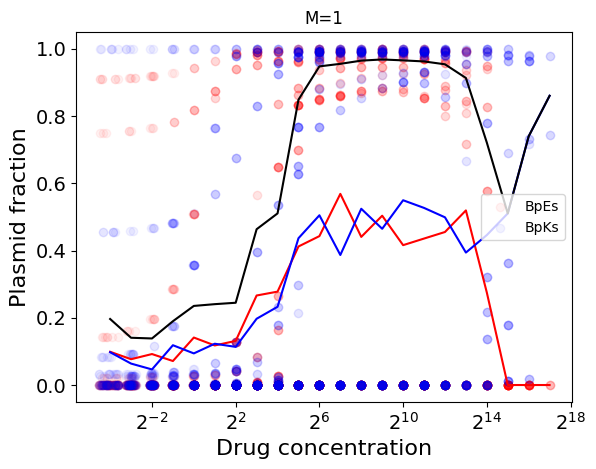

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


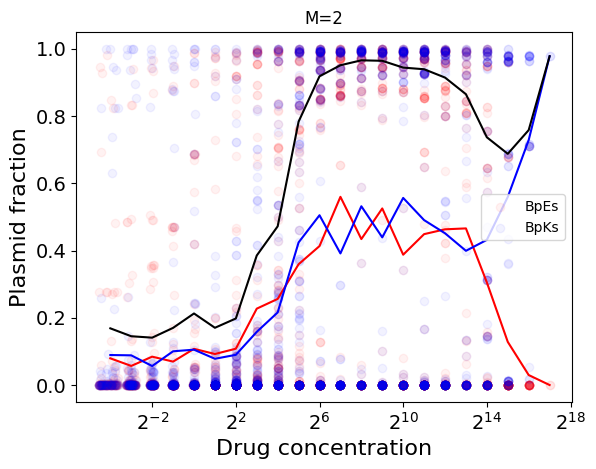

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


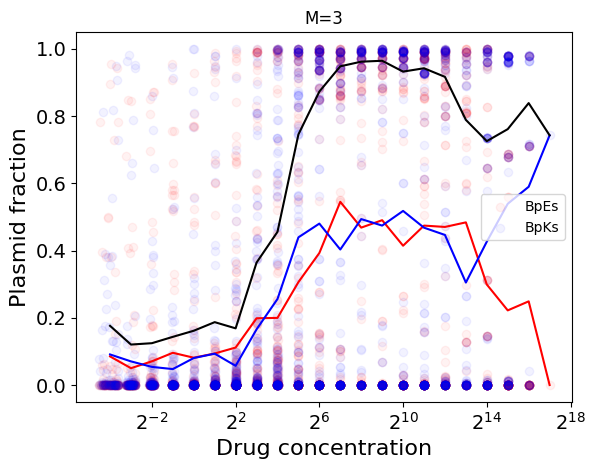

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


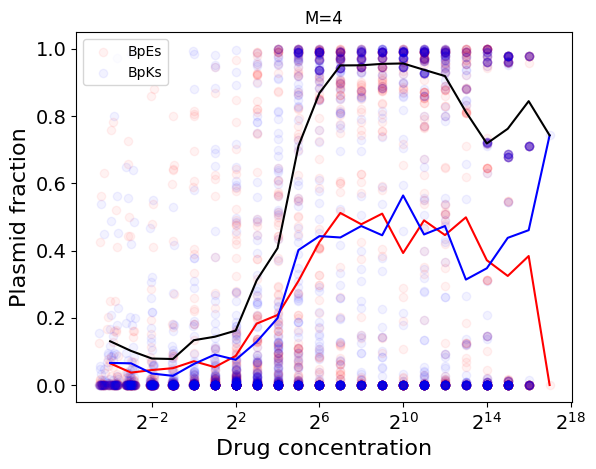

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


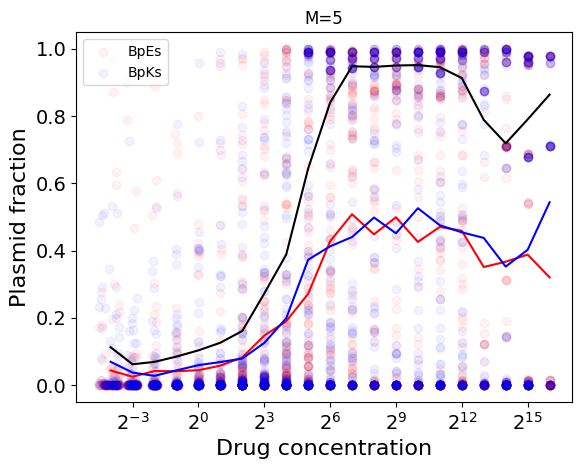

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


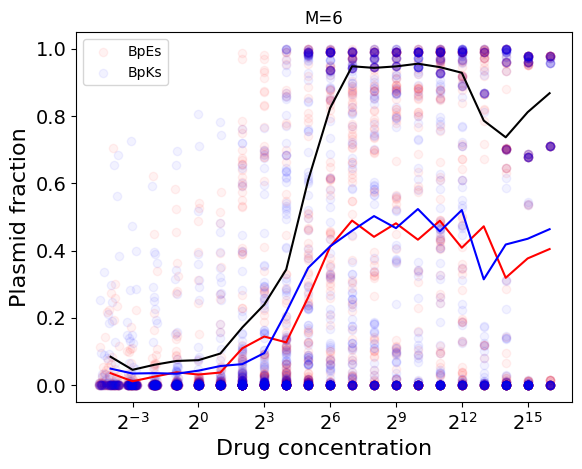

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


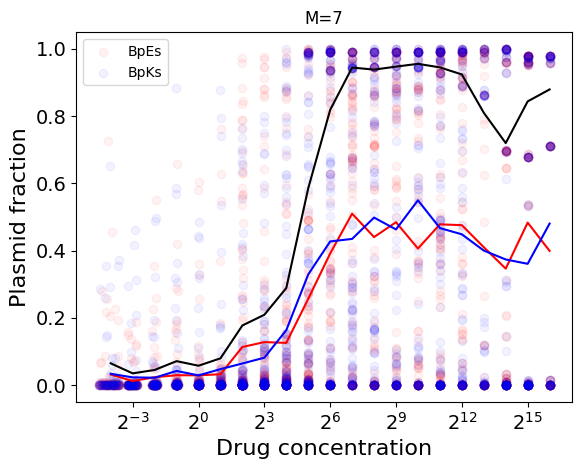

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


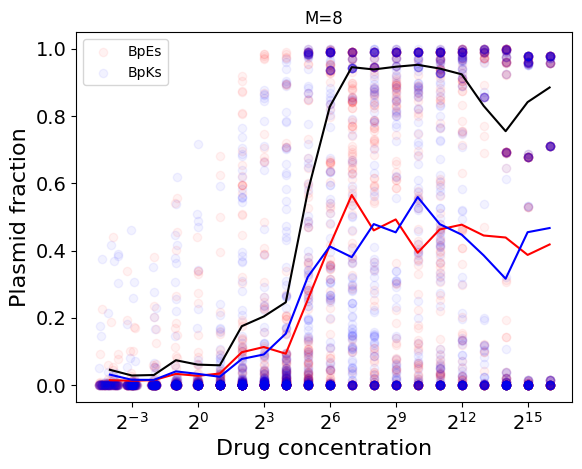

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


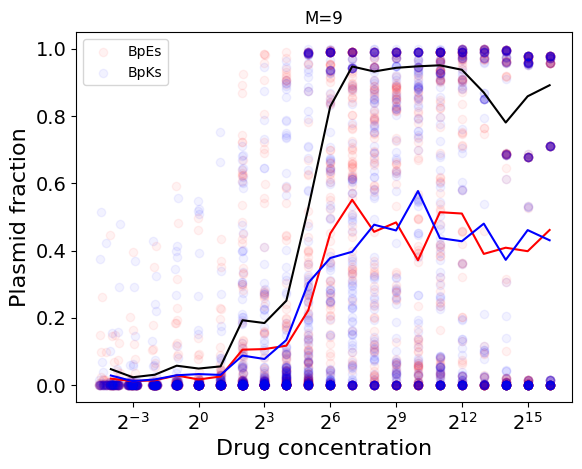

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


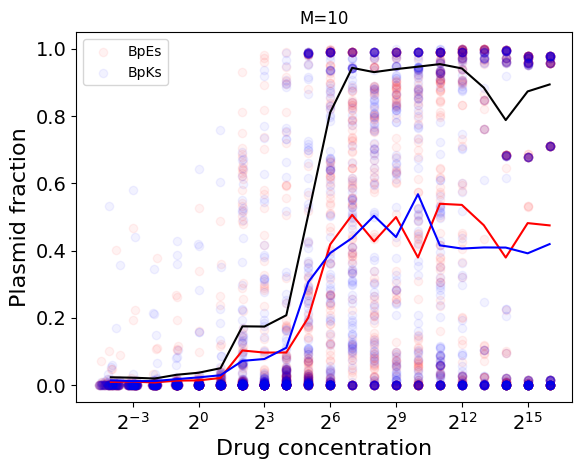

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


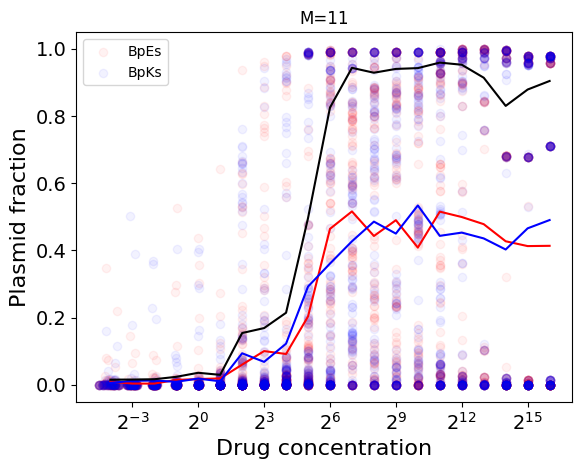

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


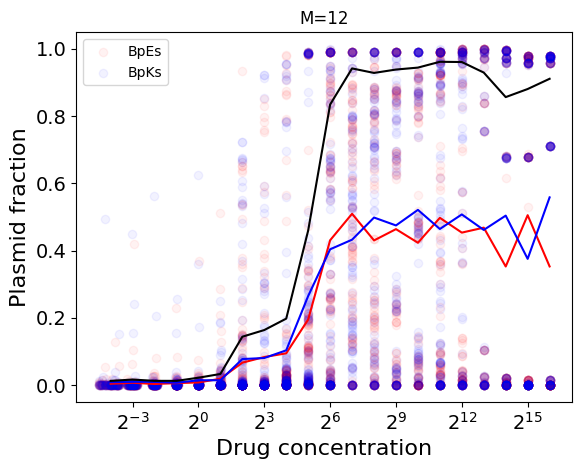

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


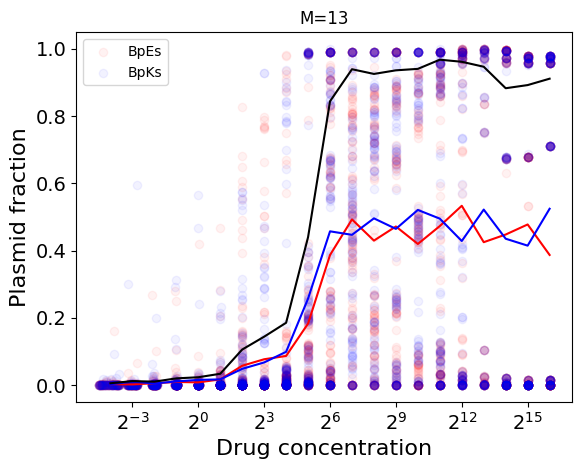

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


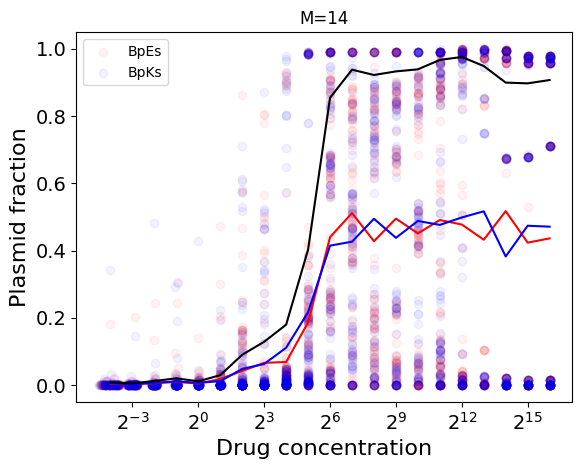

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


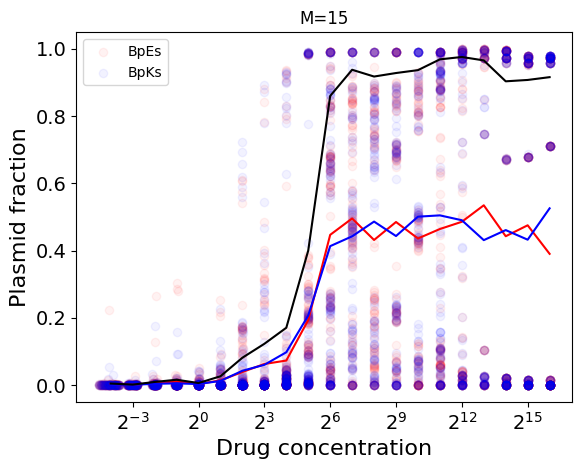

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


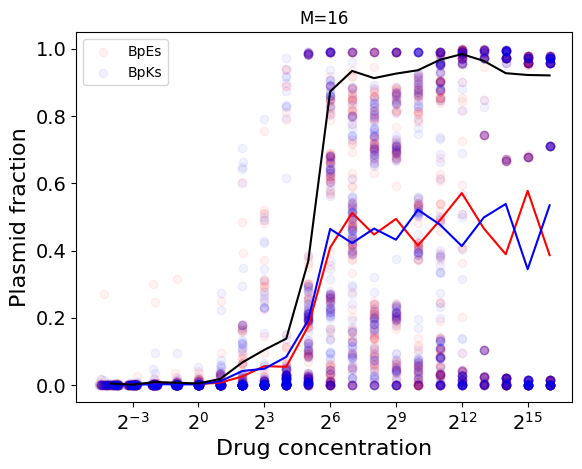

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


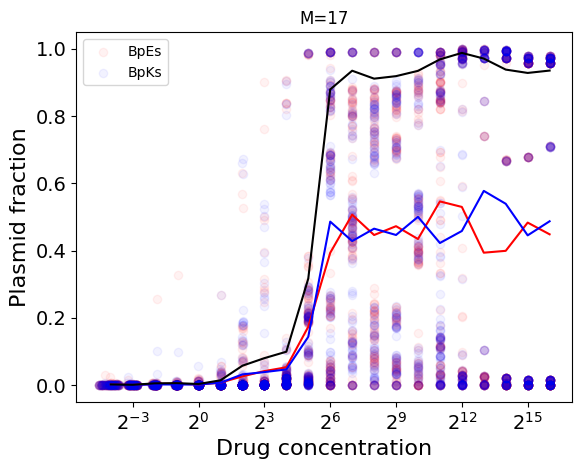

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


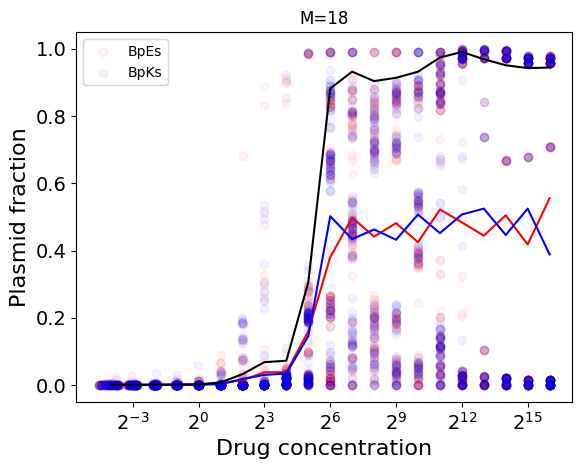

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


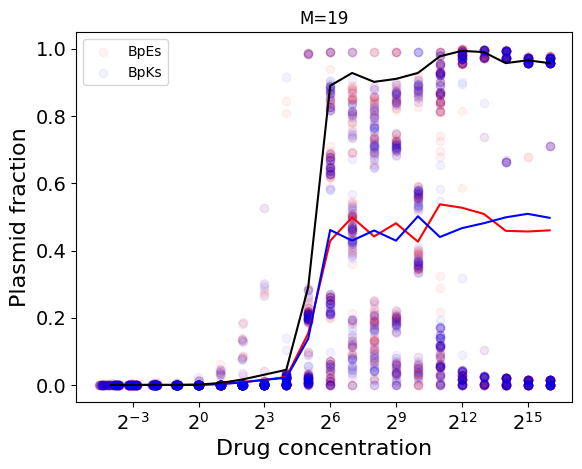

<ipython-input-30-5ce628d52a71>:123: RuntimeWarning: Mean of empty slice
  mean_PF_Es = [np.nanmean(np.array(expe_PF_Es)[np.array(expe_As) == A]) for A in unique_As]
<ipython-input-30-5ce628d52a71>:124: RuntimeWarning: Mean of empty slice
  mean_PF_Ks = [np.nanmean(np.array(expe_PF_Ks)[np.array(expe_As) == A]) for A in unique_As]


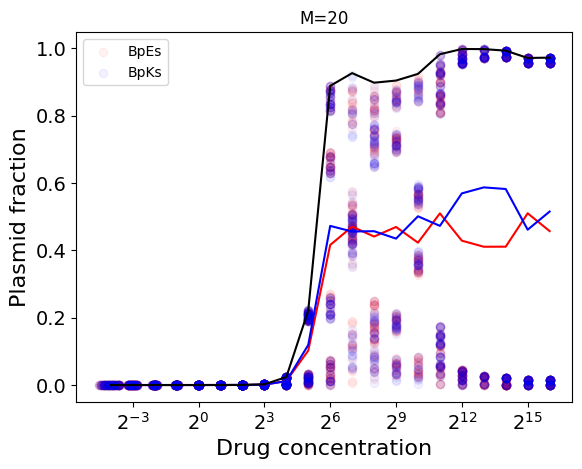

In [31]:
for M in M_values:
  load_and_plot_A_v_PF(M, Amax_values, verbose=False)

The following code loads simulation results from a specified directory. These results correspond to different experimental conditions defined by drug concentrations (Amax_values) and a fixed number of strains (M). The function goes through each simulation and checks whether the final total bacterial density is above a certain threshold, indicating survival of the bacterial population. The proportion of simulations where the population survives is calculated for each drug concentration, and these survival proportions are plotted as a function of drug concentration.

In [32]:
def load_survival(M, Amax_values, verbose=False):
    """
    Load the simulation results and plot the survival rates as a function of drug concentration.

    Parameters:
    M: int
        The maximum number of strains.
    Amax_values: list
        List of drug concentrations.
    verbose: bool, optional
        If True, print verbose output. Default is False.
    """
    expe_Amaxs = []
    expe_survival = []

    for Amax in Amax_values:
        # Define the path to the files
        runPath = '%s%s_N%s_A%se-2/' % (runPathN, str_E, num_days, int(Amax*100))
        if not os.path.isdir(runPath):
            print(f"Directory {runPath} does not exist. Skipping.")
        else:

          # Get the sequences from the files
          expe_istrains = get_sequences_from_files(runPath, length=len(strains_subset))
          total_experiments = 0
          survived_experiments = 0

          for iexpe in range(np.min([num_experiments, len(expe_istrains)])):
              # Select M strains
              this_istrains = expe_istrains[iexpe][:M]

              # Create a string label for the simulation
              sim_lbl = "_".join(map(str, this_istrains))

              # Define the file path
              filePath = f"{runPath}sim_Es_{sim_lbl}.pkl"

              if os.path.isfile(filePath):
                  # Load the simulation results
                  this_subset, this_Es, this_Btot, this_BpEs, this_BpKs, this_BfEs, this_BfKs, this_freqpEs, this_freqpKs, this_ts, this_ys, this_params  = load_simulation_results(filePath)
                  if verbose:
                      print("%s: Loading %s" % (iexpe, filePath))
                  for j in range(len(this_Btot)):
                      # Calculate the survival rate
                      total_experiments += 1
                      if this_Btot[j][-1] > expe_params['extinction_threshold']:
                          survived_experiments += 1

              if total_experiments>0:
                expe_Amaxs.append(Amax)
                expe_survival.append(100.0*survived_experiments / total_experiments)


    # Plot the survival rates
    return expe_Amaxs, expe_survival

def plot_survival(expe_As, expe_survival, M, color, ax):
    """
    Plot the survival rates as a function of drug concentration.

    Parameters:
    expe_As: list
        List of drug concentrations.
    expe_survival: list
        List of survival rates.
    M: int
        The maximum number of strains.
    color: str
        Color for the plot.
    ax: matplotlib.axes.Axes
        The axes on which to plot.
    """
    ax.plot(expe_As, expe_survival, color=color, lw=2)

    # Set labels, scales, limits and tick parameters
    ax.set_xlabel('Drug concentration (log2)', fontsize=16)
    ax.set_ylabel('Survival (%)', fontsize=16)
    ax.set_ylim([-0.05, 105])
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)
    #ax.set_xscale('log', base=2)


This plot shows the survival rate as a function of drug concentration for different community sizes. The size of the community (M) is encoded in color, with a colorbar providing a key for the colors.

A different line is plotted for each community size. For each line, the drug concentration (Amax) is plotted on the x-axis and the survival rate is plotted on the y-axis. This allows you to see how the survival rate changes as the drug concentration increases, and how this relationship differs for communities of different sizes.



<ipython-input-33-1712fc0c5691>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis')
<ipython-input-33-1712fc0c5691>:32: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = fig.colorbar(sm, orientation='vertical', label='Size of community (M)')


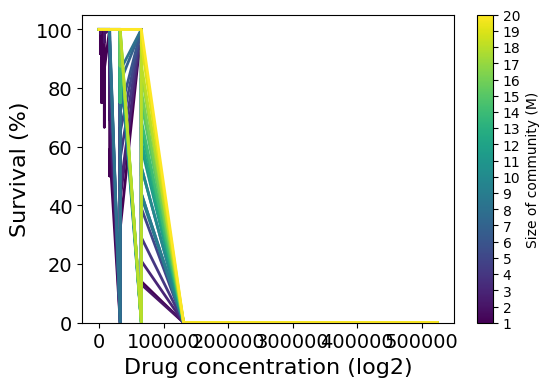

In [33]:
import matplotlib.cm as cm
from matplotlib import colors
import matplotlib.ticker as ticker

fig, ax = plt.subplots(figsize=(6, 4))

cmap = cm.get_cmap('viridis')

norm = colors.Normalize(vmin=np.min(M_values), vmax=np.max(M_values))

survival_all=[]
Amax_all=[]
for M in M_values:

    expe_Amaxs, expe_survival = load_survival(M, Amax_values,verbose=False)

    survival_all.append(expe_survival)
    Amax_all.append(expe_Amaxs)

    # Plot survival as a function of Amax
    color = cmap(norm(M))
    plot_survival(expe_Amaxs, expe_survival, M, color, ax)


sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

# Create a custom locator for the colorbar
tick_locator = ticker.MaxNLocator(nbins=np.max(M_values)-np.min(M_values)+1)

# Create colorbar and apply custom locator
cb = fig.colorbar(sm, orientation='vertical', label='Size of community (M)')
cb.locator = tick_locator
cb.update_ticks()



plt.show()

In [34]:
print(len(survival_all[0]))

2311


We use the following code to visualize survival rates as a function of two parameters: community size (M) and drug concentration (Amax). The data for these parameters are provided as inputs to the function in the form of a survival rate matrix (survival_all), a list of lists for different drug concentrations (Amax_all), and a list of community sizes (M_values).

The function first creates a scatter plot with each point's x-coordinate corresponding to a community size and the y-coordinate corresponding to the logarithm base 2 of a drug concentration. The color of each point is determined by the survival rate associated with the given community size and drug concentration, represented as a percentage and visualized using a colormap ranging from 0% (blue) to 100% (yellow).

<ipython-input-35-c34b635905bb>:19: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Survival %')


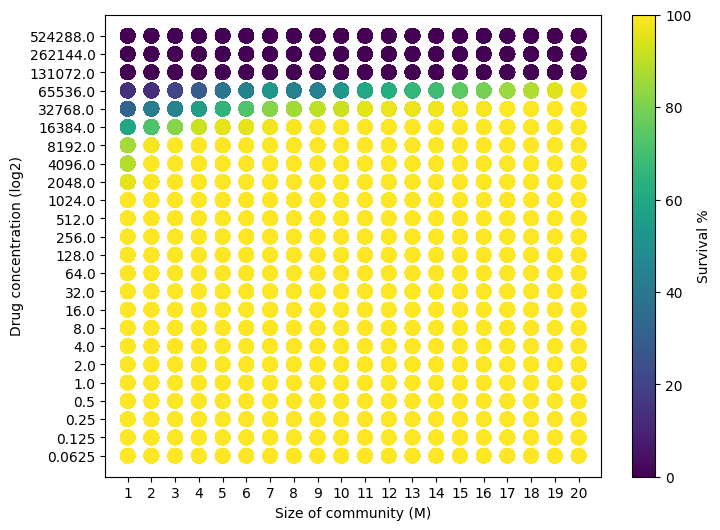

In [35]:
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

def plot_survival_scatter(survival_all, Amax_all, M_values):
    fig, ax = plt.subplots(figsize=(8, 6))

    # Create a Normalize object for mapping color
    norm = Normalize(vmin=0, vmax=100)  # Assuming survival values are percentages (0-100)

    # Plot data points for each M value
    for M_val, survival_vals, Amax_vals in zip(M_values, survival_all, Amax_all):
        ax.scatter([M_val]*len(survival_vals), np.log2(Amax_vals), c=survival_vals, cmap='viridis', norm=norm, s=100)

    # Create a ScalarMappable object for creating the colorbar
    sm = ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])  # This line is necessary for the colorbar to appear

    # Add a colorbar
    plt.colorbar(sm, label='Survival %')

    # Get unique Amax values for y ticks
    flattened_Amax = [val for sublist in Amax_all for val in sublist]
    sorted_unique_Amax = sorted(list(set(flattened_Amax)))

    # Set axis labels and ticks
    ax.set_xlabel('Size of community (M)')
    ax.set_ylabel('Drug concentration (log2)')
    ax.set_yticks(np.log2(sorted_unique_Amax))
    ax.set_yticklabels(sorted_unique_Amax)
    ax.set_xticks(M_values)

    plt.show()

# Call the function
plot_survival_scatter(survival_all, Amax_all, M_values)


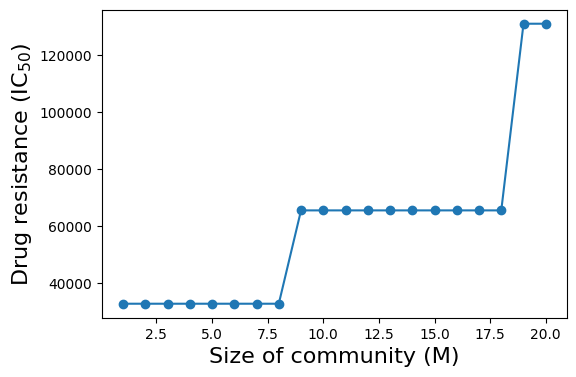

In [36]:
def plot_ic50(survival_all, Amax_all, M_values):
    # Initialize an empty list to store IC50 values
    IC50_values = []

    # For each column (M value), find the critical drug concentration (IC50)
    for i in range(len(M_values)):
        survival_column = survival_all[i]
        for j in range(len(Amax_all[i])):
            if survival_column[j] < 50:
                IC50_values.append(Amax_all[i][j])
                break
        else:
            # If no IC50 value found for a particular M, append NaN
            IC50_values.append(np.nan)

    # Plot M vs IC50
    plt.figure(figsize=(6, 4))
    plt.plot(M_values, IC50_values, marker='o')
    plt.xlabel('Size of community (M)',fontsize=16)
    plt.ylabel(r'Drug resistance (IC$_{50}$)',fontsize=16)
    plt.grid(False)
    plt.show()

plot_ic50(survival_all, Amax_all, M_values)


The following plot displays the average Minimum Inhibitory Concentration (MIC) as a function of community size (M), where each data point corresponds to a specific community size. Error bars represent the standard error of the mean (SEM), quantifying the variability in MIC at each community size. This variability provides insight into potential variation in MIC if the experiments were conducted multiple times.

The following code generates a plot showing how the density of a microbial community changes with community size (M), for a given drug concentration (A).

In [37]:
def load_and_plot_Ms_density(M_values, Amax, verbose=False):
    """
    Load the simulation results and prepare data to plot bacterial density as a function of community size.

    Parameters:
    M_values: list
        List of community sizes.
    Amax: float
        Maximum drug concentration.
    verbose: bool, optional
        If True, print verbose output. Default is False.
    """
    expe_Btots = []
    expe_BpEs = []
    expe_BpKs = []
    expe_BfEs = []
    expe_BfKs = []
    expe_Ms = []

    # Define the path to the files
    runPath = '%s%s_N%s_A%se-2/' % (runPathN, str_E, num_days, int(100*Amax))
    if not os.path.isdir(runPath):
        print(f"Directory {runPath} does not exist. Skipping.")
        return

    expe_istrains = get_sequences_from_files(runPath, length=len(strains_subset))

    for M in M_values:
        for iexpe in range(np.min([len(expe_istrains), num_experiments])):
            this_istrains = expe_istrains[iexpe][:M]  # Select M strains
            sim_lbl = "_".join(map(str, this_istrains))  # Create a string label for the simulation

            # Define the file path
            filePath = f"{runPath}sim_Es_{sim_lbl}.pkl"

            if os.path.isfile(filePath):
                # Load the simulation results
                this_subset, this_Es, this_Btot, this_BpEs, this_BpKs, this_BfEs, this_BfKs, this_freqpEs, this_freqpKs, this_ts, this_ys, this_params  = load_simulation_results(filePath)

                for j in range(len(this_Btot)):
                    # Append the last value of each B-series
                    expe_Btots.append(this_Btot[j][-1])
                    expe_BpEs.append(this_BpEs[j][-1])
                    expe_BpKs.append(this_BpKs[j][-1])
                    expe_BfEs.append(this_BfEs[j][-1])
                    expe_BfKs.append(this_BfKs[j][-1])
                    expe_Ms.append(M)

    # Plot the bacterial density as a function of community size
    plot_final_fraction_Ms_density(expe_Ms, expe_Btots, expe_BpEs, expe_BpKs, expe_BfEs, expe_BfKs, Amax)

def plot_final_fraction_Ms_density(expe_Ms, expe_Btots, expe_BpEs, expe_BpKs, expe_BfEs, expe_BfKs, Amax):
    """
    Plot the bacterial density as a function of community size.

    Parameters:
    expe_Ms: list
        List of community sizes.
    expe_Btots, expe_BpEs, expe_BpKs, expe_BfEs, expe_BfKs: list
        Lists of bacterial densities.
    Amax: float
        Maximum drug concentration.
    """
    jitter = 0.02  # Add jitter to avoid overplotting
    expe_Ms_jittered = expe_Ms + np.random.uniform(-jitter, jitter, size=len(expe_Ms))

    # Create the scatter plot
    plt.scatter(expe_Ms_jittered, expe_Btots, alpha=0.05, color='black', label='Btots')
    plt.scatter(expe_Ms_jittered, expe_BpEs, alpha=0.05, color='red', label='BpEs')
    plt.scatter(expe_Ms_jittered, expe_BpKs, alpha=0.05, color='blue', label='BpKs')

    # Calculate the mean for each unique M value
    unique_Ms = np.unique(expe_Ms)
    mean_Btots = [np.mean(np.array(expe_Btots)[np.array(expe_Ms) == M]) for M in unique_Ms]
    mean_BpEs = [np.mean(np.array(expe_BpEs)[np.array(expe_Ms) == M]) for M in unique_Ms]
    mean_BpKs = [np.mean(np.array(expe_BpKs)[np.array(expe_Ms) == M]) for M in unique_Ms]

    # Plot the mean frequencies
    plt.plot(unique_Ms, mean_Btots, color='black')
    plt.plot(unique_Ms, mean_BpEs, color='red')
    plt.plot(unique_Ms, mean_BpKs, color='blue')

    # Add labels to the axes and title
    plt.xlabel(r'Community Size ($M$)', fontsize=16)
    plt.ylabel('Bacterial density', fontsize=16)
    plt.title('Amax=%s' % (Amax))

    plt.xticks(range(1+len(np.unique(expe_Ms))))
    plt.xlim([0.5, 0.5+len(np.unique(expe_Ms))])

    ax = plt.gca()  # Get current Axes instance
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)

    plt.legend()

    # Display the plot
    plt.show()


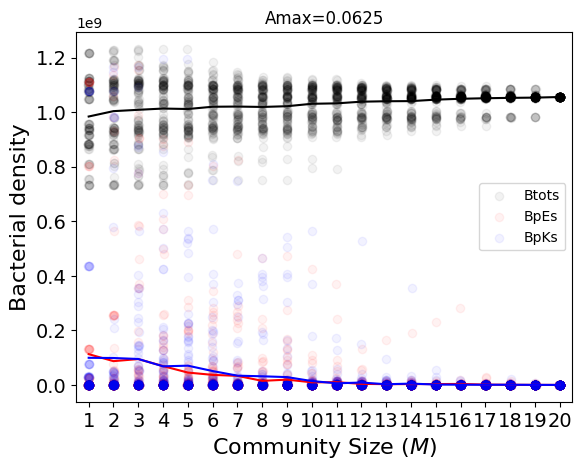

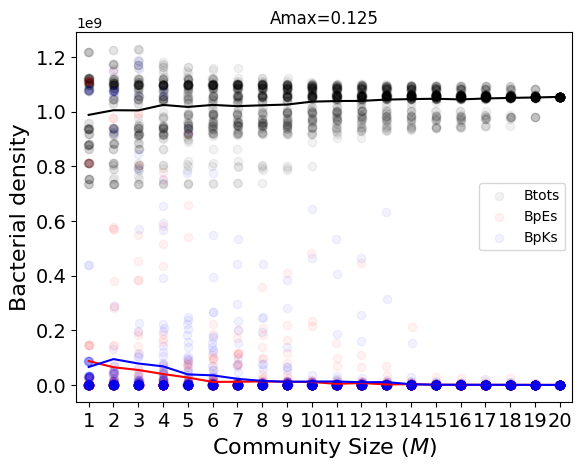

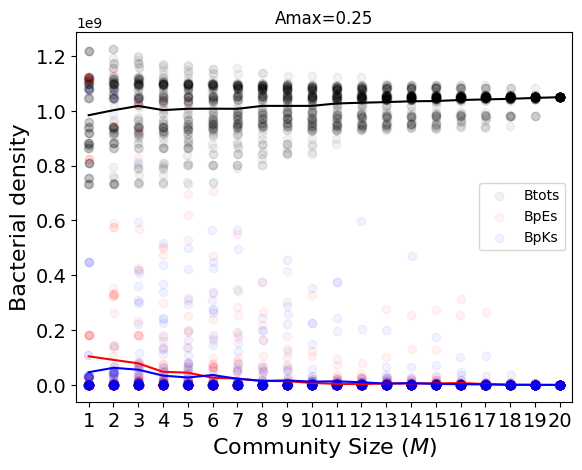

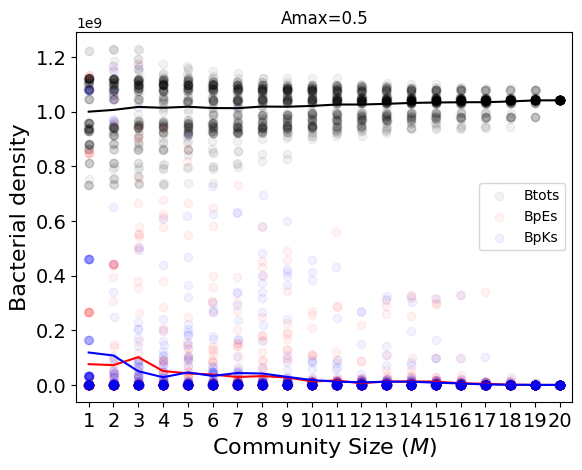

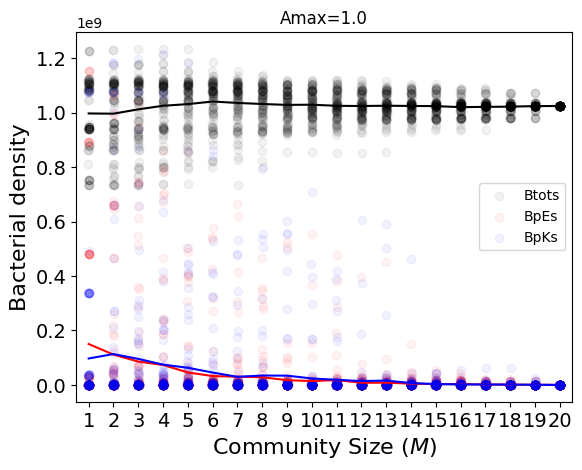

...

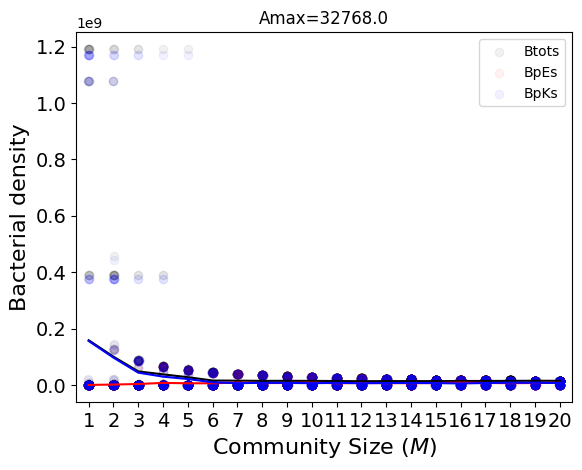

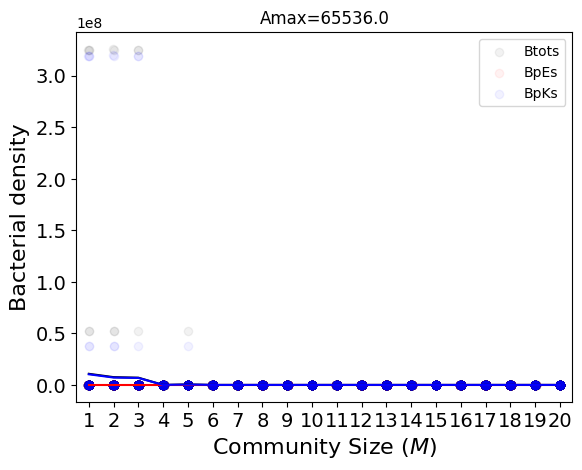

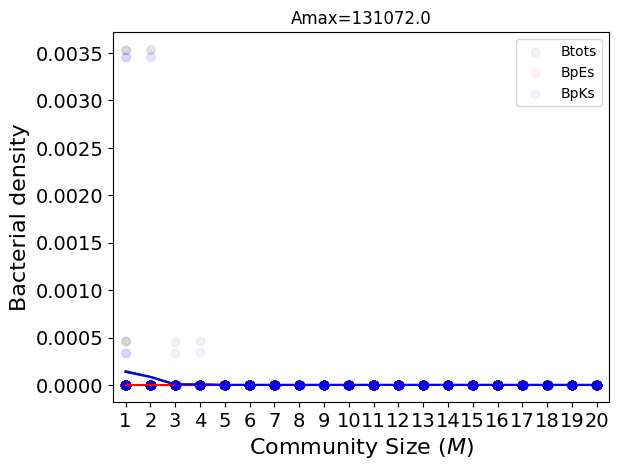

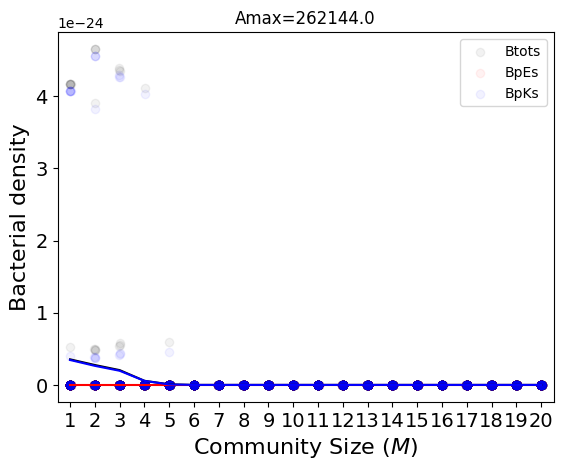

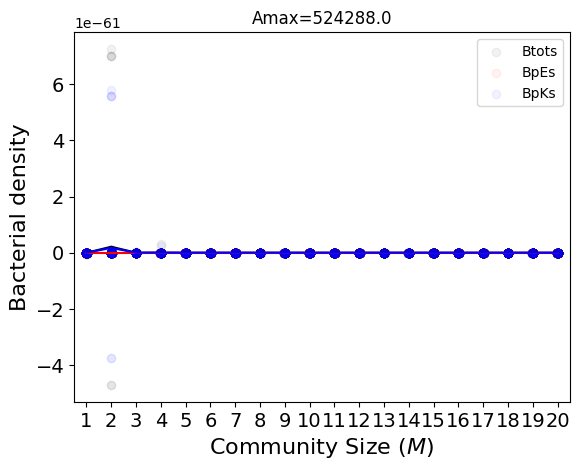

In [38]:

for A in Amax_values:
    load_and_plot_Ms_density(M_values, A, verbose=False)


In [39]:


def load_PF_M(M_values, Amax, verbose=False):
    """
    Load and process simulation results from a directory.

    Parameters:
    M_values: list
        List of community sizes to consider.
    Amax: float
        The concentration of the drug for which the simulations were run.
    verbose: bool, optional
        If True, print additional information.

    Returns:
    final_expe: list
        List of indices of the experiments for each strain.
    final_M: list
        List of sizes of the community for each strain.
    final_pf: list
        List of final plasmid fractions for each strain.
    stabilizing_strains: list
        List of stabilizing strains.
    """

    final_pf=[]
    final_M=[]
    final_expe=[]
    stabilizing_strains=[]

    runPath = '%s%s_N%s_A%se-2/' % (runPathN, str_E, num_days, int(100*Amax))
    if not os.path.isdir(runPath):
        print(f"Directory {runPath} does not exist. Skipping.")
        return final_expe, final_M, final_pf, stabilizing_strains

    expe_istrains = get_sequences_from_files(runPath, length=len(strains_subset))

    for iexpe in range(np.min([num_experiments, len(expe_istrains)])):
        for this_istrains in [expe_istrains[iexpe]]:
            if verbose:
                print(this_istrains)

            unstable = [True]*len(expe_istrains)

            for M in M_values:
                M_istrains = this_istrains[:M]  # fix M value
                str_subset = [str(x) for x in M_istrains]  # Convert all elements to string
                sim_lbl = "_".join(str_subset)  # Join elements with "_"
                fileName = "sim_Es_%s.pkl" % sim_lbl  # Construct the filename
                filePath = "%s%s" % (runPath, fileName)
                if os.path.isfile(filePath):
                    this_subset, this_Es, this_Btot, this_BpEs, this_BpKs, this_BfEs, this_BfKs, this_freqpEs, this_freqpKs, this_ts, this_ys, this_params  = load_simulation_results(filePath)
                    if verbose:
                        print("%s: Loading %s" % (M, filePath))

                    for j in range(len(this_Btot)):
                        this_Bp = this_BpEs[j][-1] + this_BpKs[j][-1] # final Bp value
                        this_density = this_Btot[j][-1] # final total density

                        if this_density > 1:  # tmp
                            this_final_pf = this_Bp / this_density
                        else:
                            this_final_pf = np.nan

                        if verbose:
                            print('\t',this_Bp, ' / ', this_density, ' = ', np.round(100*this_final_pf),'%')
                        final_pf.append(this_final_pf)
                        final_M.append(M)
                        final_expe.append(iexpe)

                        if unstable[iexpe]==True:

                            if this_final_pf>0.5: #plasmid stable
                                if M>1: #More than one strain
                                  if verbose:
                                      print("*** Stabilizing strain %s: %s"%(iexpe, M_istrains[-1]))
                                  stabilizing_strains.append(M_istrains[-1])

                                unstable[iexpe]=False
                else:
                    if verbose:
                        print("Not found %s" % (filePath))
    return final_expe, final_M, final_pf, stabilizing_strains

def plot_M_v_PF(final_expe, final_M, final_pf):
    """
    Plot the final plasmid fraction against the size of the community for each experiment.

    Parameters:
    final_expe: list
        List of indices of the experiments for each strain.
    final_M: list
        List of sizes of the community for each strain.
    final_pf: list
        List of final plasmid fractions for each strain.

    Returns:
    None
    """

    # Get unique experiment indices
    unique_expe = list(set(final_expe))

    # Initialize plot
    plt.figure(figsize=(6, 4))  # Adjust the size as needed

    # Loop over unique experiment indices and plot each line separately
    for expe in unique_expe:
        # Get M and pf values for this experiment
        M_values = [final_M[i] for i in range(len(final_expe)) if final_expe[i] == expe]
        pf_values = [final_pf[i] for i in range(len(final_expe)) if final_expe[i] == expe]

        # Plot M vs pf for this experiment
        plt.plot(M_values, pf_values,'-') #, label=f"Experiment {expe}"


    ax = plt.gca()  # Get current Axes instance
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)

    #plt.legend()
    plt.xlabel(r"Size of community ($M$)", fontsize=16)
    plt.ylabel("Final plasmid fraction", fontsize=16)
    plt.ylim([-0.05, 1.05])
    plt.show()


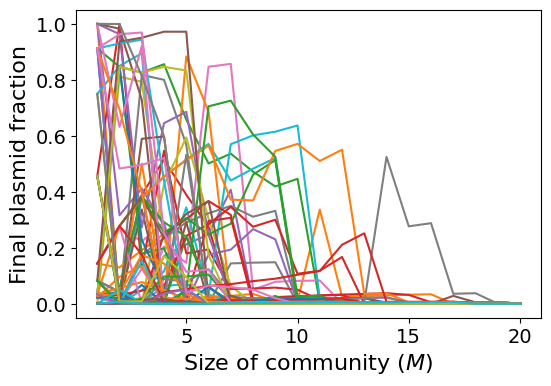

Stabilizing strains (Amax=0.0625):
	[38] PF_KPN11: 8
	[15] PF_EC16: 5
	[2] PF_EC03: 5
	[20] PF_EC21: 1
	[29] PF_KQ01: 1


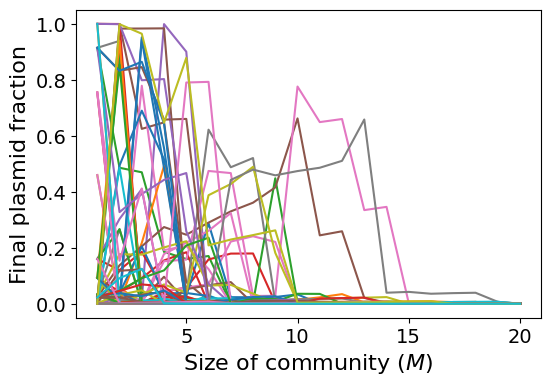

Stabilizing strains (Amax=0.125):
	[38] PF_KPN11: 6
	[15] PF_EC16: 5
	[2] PF_EC03: 2
	[20] PF_EC21: 1
	[25] PF_KPN01: 1


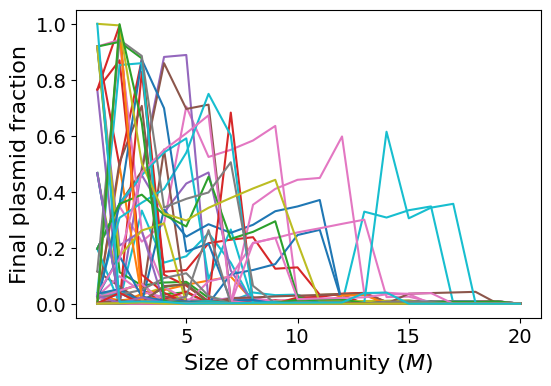

Stabilizing strains (Amax=0.25):
	[15] PF_EC16: 7
	[2] PF_EC03: 4
	[38] PF_KPN11: 4
	[37] PF_KPN10: 1
	[43] PF_KPN14: 1


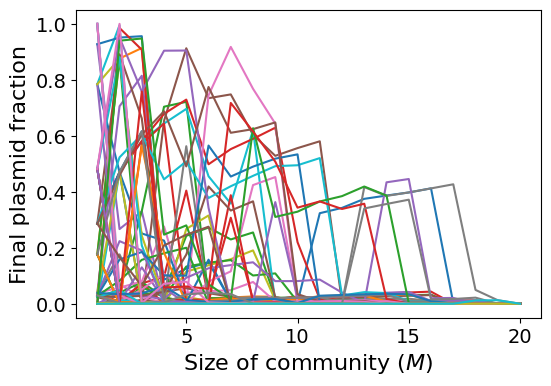

Stabilizing strains (Amax=0.5):
	[38] PF_KPN11: 7
	[2] PF_EC03: 6
	[15] PF_EC16: 5
	[20] PF_EC21: 3
	[45] PF_KPN16: 1
	[25] PF_KPN01: 1


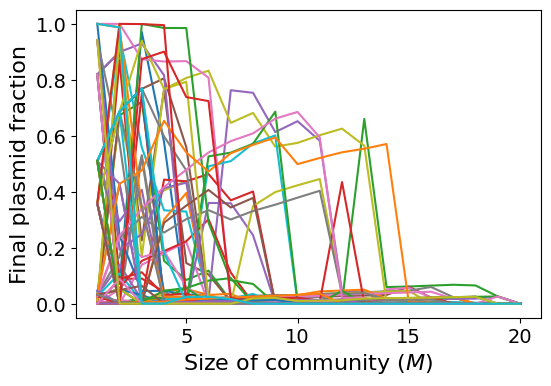

Stabilizing strains (Amax=1.0):
	[2] PF_EC03: 7
	[38] PF_KPN11: 7
	[15] PF_EC16: 5
	[29] PF_KQ01: 2


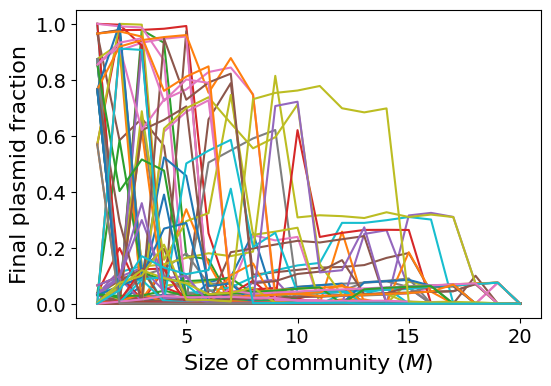

Stabilizing strains (Amax=2.0):
	[2] PF_EC03: 9
	[38] PF_KPN11: 4
	[15] PF_EC16: 3


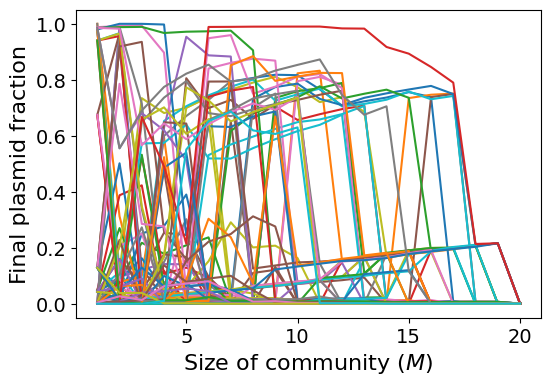

Stabilizing strains (Amax=4.0):
	[2] PF_EC03: 22
	[15] PF_EC16: 6
	[20] PF_EC21: 2
	[38] PF_KPN11: 2
	[18] PF_EC19: 1
	[45] PF_KPN16: 1


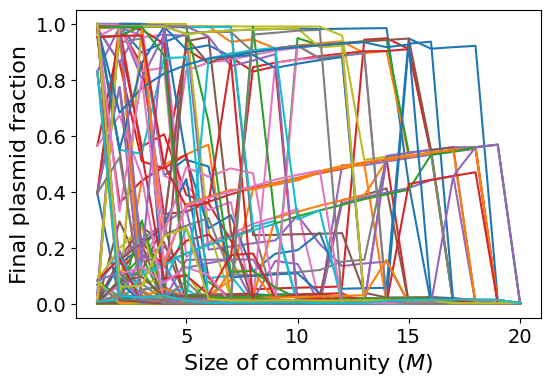

Stabilizing strains (Amax=8.0):
	[2] PF_EC03: 8
	[38] PF_KPN11: 4
	[21] PF_EC22: 3
	[15] PF_EC16: 2
	[41] PF_KPN12: 1
	[43] PF_KPN14: 1


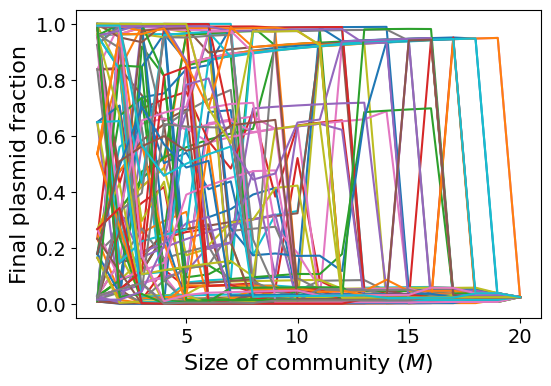

Stabilizing strains (Amax=16.0):
	[2] PF_EC03: 9
	[21] PF_EC22: 4
	[15] PF_EC16: 3
	[41] PF_KPN12: 3
	[18] PF_EC19: 3
	[38] PF_KPN11: 2
	[9] PF_EC10: 2
	[20] PF_EC21: 1
	[26] PF_KPN02: 1
	[11] PF_EC12: 1
	[25] PF_KPN01: 1
	[37] PF_KPN10: 1


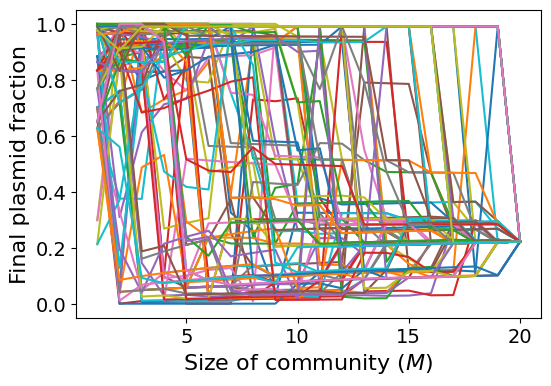

Stabilizing strains (Amax=32.0):
	[21] PF_EC22: 2
	[20] PF_EC21: 1
	[15] PF_EC16: 1


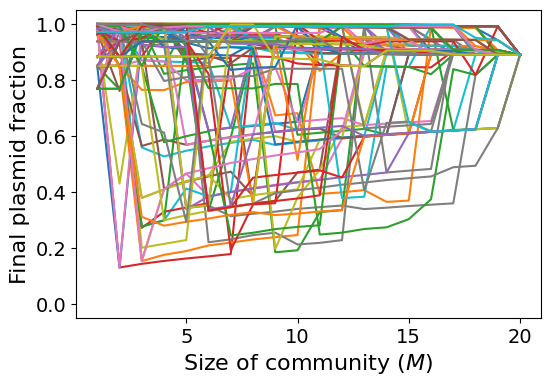

Stabilizing strains (Amax=64.0):


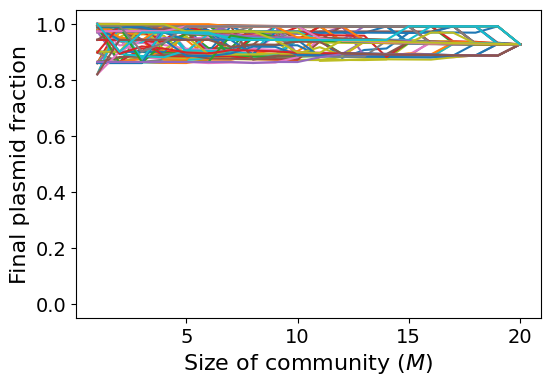

Stabilizing strains (Amax=128.0):


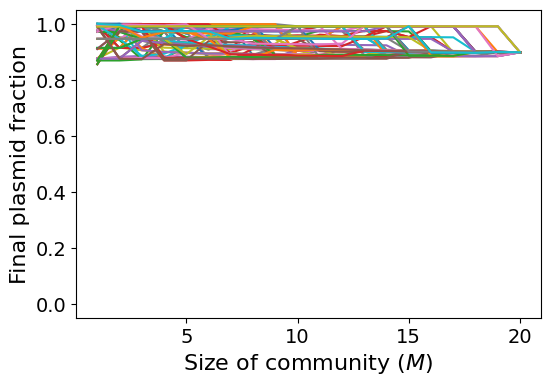

Stabilizing strains (Amax=256.0):


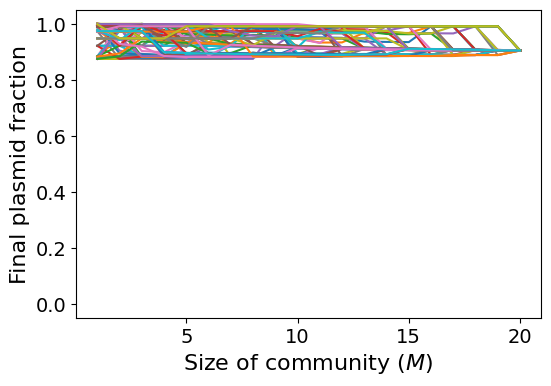

Stabilizing strains (Amax=512.0):


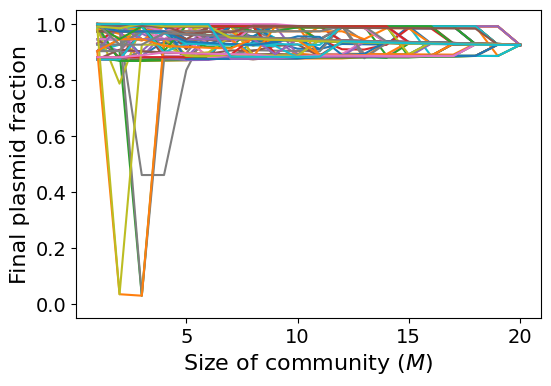

Stabilizing strains (Amax=1024.0):


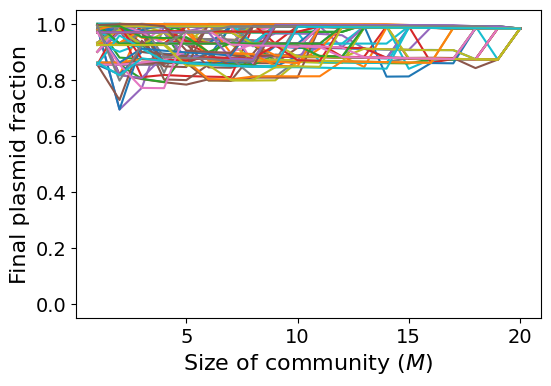

Stabilizing strains (Amax=2048.0):
	[18] PF_EC19: 1
	[11] PF_EC12: 1
	[25] PF_KPN01: 1
	[1] PF_EC02: 1


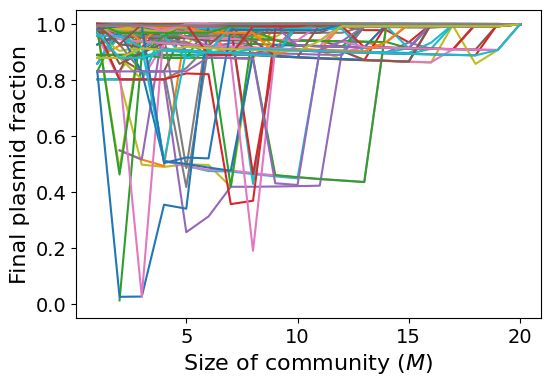

Stabilizing strains (Amax=4096.0):
	[20] PF_EC21: 2
	[41] PF_KPN12: 2
	[2] PF_EC03: 1
	[15] PF_EC16: 1
	[25] PF_KPN01: 1
	[9] PF_EC10: 1
	[21] PF_EC22: 1
	[43] PF_KPN14: 1
	[6] PF_EC07: 1


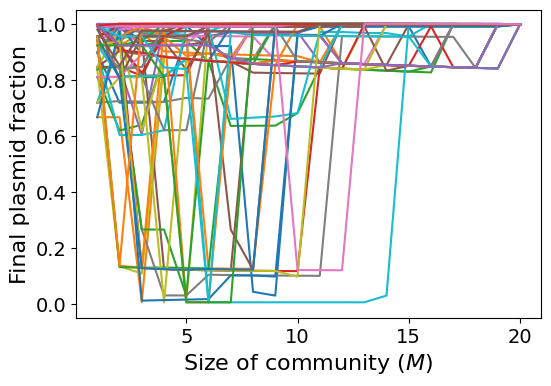

Stabilizing strains (Amax=8192.0):
	[6] PF_EC07: 3
	[15] PF_EC16: 2
	[38] PF_KPN11: 1
	[1] PF_EC02: 1
	[18] PF_EC19: 1
	[37] PF_KPN10: 1


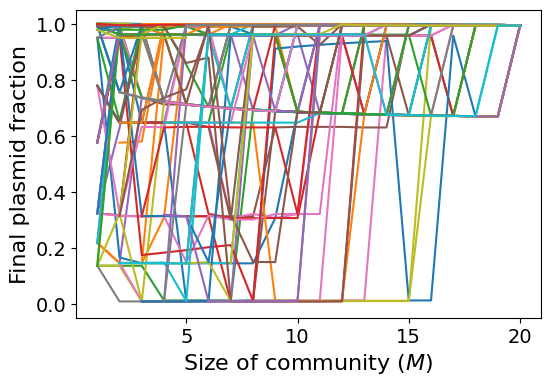

Stabilizing strains (Amax=16384.0):
	[26] PF_KPN02: 17
	[29] PF_KQ01: 13
	[43] PF_KPN14: 8
	[38] PF_KPN11: 8
	[2] PF_EC03: 4
	[18] PF_EC19: 2
	[37] PF_KPN10: 2
	[25] PF_KPN01: 2
	[21] PF_EC22: 2


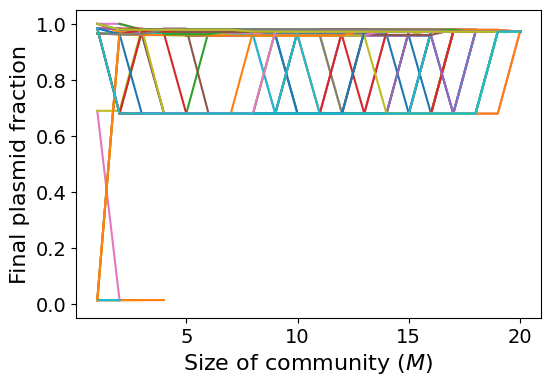

Stabilizing strains (Amax=32768.0):
	[26] PF_KPN02: 34
	[29] PF_KQ01: 22
	[38] PF_KPN11: 21
	[37] PF_KPN10: 2


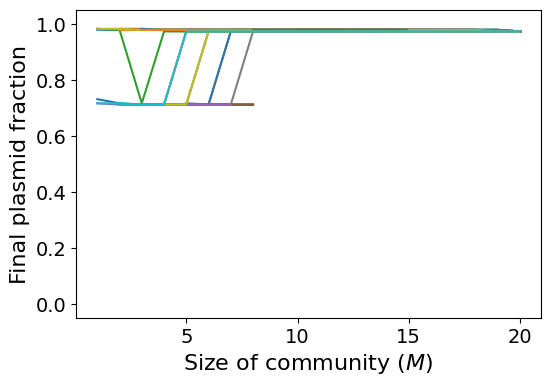

Stabilizing strains (Amax=65536.0):
	[38] PF_KPN11: 66
	[29] PF_KQ01: 20


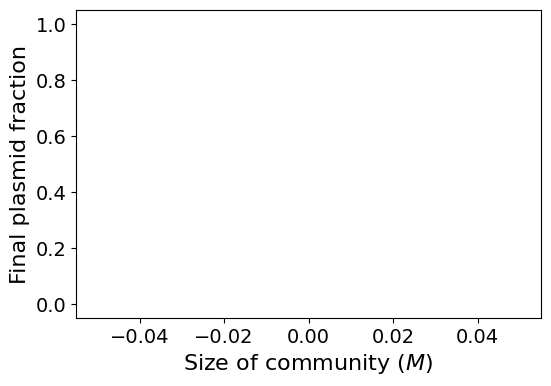

Stabilizing strains (Amax=131072.0):


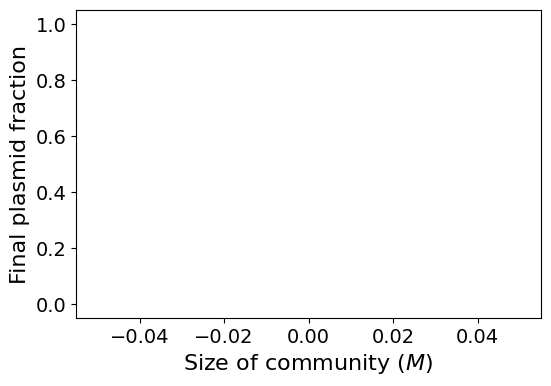

Stabilizing strains (Amax=262144.0):


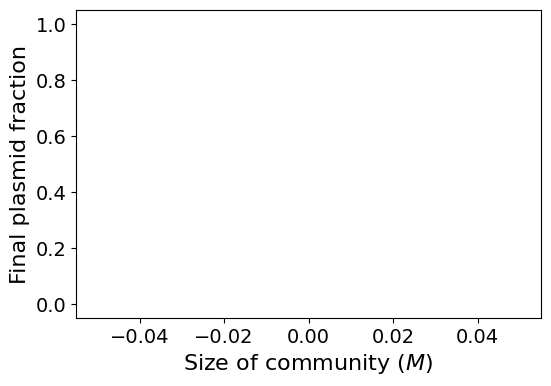

Stabilizing strains (Amax=524288.0):


In [40]:
counts_score = []  # list to store final plasmid frequencies for all Amax values
counts_Amax = []
for Amax in Amax_values:
    final_expe, final_M, final_pf, stabilizing_strains, = load_PF_M(M_values, Amax, verbose=False)
    final_score=[]

    plot_M_v_PF(final_expe, final_M, final_pf)

    count_stabilizing_strains = Counter(stabilizing_strains)
    print("Stabilizing strains (Amax=%s):"%Amax)
    for element, count in count_stabilizing_strains.most_common():
        print(f"\t[{element}] {strain_names[element]}: {count}")

    counts_Amax.append(count_stabilizing_strains)
    counts_score.append(list(final_score))  # Store each Amax's scores as a separate list


In [41]:
def create_stabilizing_matrix(strains, counts_Amax):
    """
    Create a matrix representing the number of times each strain stabilized the community, for each Amax value.

    Parameters:
    strains: list
        List of different bacterial strains.
    counts_Amax: list of dictionaries
        Each dictionary contains the counts of stabilizing strains for a certain Amax value.
        The keys of the dictionary are strain indices and the values are the counts.

    Returns:
    matrix: np.ndarray
        A 2D array where each row corresponds to a strain and each column corresponds to an Amax value.
        The entry at each position (i, j) in the matrix is the number of times strain i was a stabilizing
        strain for Amax value j.
    """
    # Initialize an empty matrix with dimensions (number_of_strains x number_of_Amax_values)
    matrix = np.zeros((len(strains), len(counts_Amax)))

    # Loop over each Amax value
    for i, count in enumerate(counts_Amax):
        # Loop over each strain
        for j, strain in enumerate(strains):
            # If the strain was a stabilizing strain for this Amax value, store the count in the matrix
            if j in count:
                matrix[j, i] = count[j]

    return matrix

stability_matrix = create_stabilizing_matrix(strains, counts_Amax)


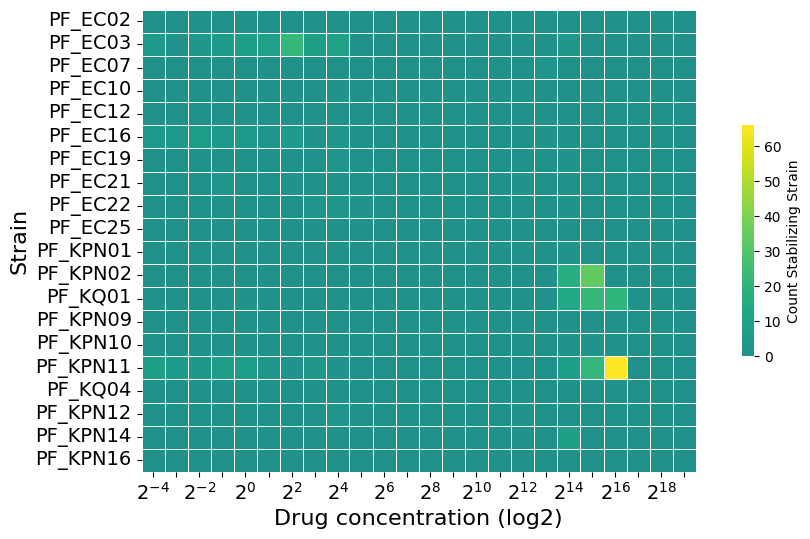

In [42]:
def plot_stabilizing_heatmap(model_params, strains_subset, stabilizing_matrix):
    """
    Plot a heatmap representing the frequency of each strain being stabilizing for different drug concentrations.

    Parameters:
    model_params: dict
        Dictionary containing model parameters, including 'strain_name' mapping strain indices to names.
    strains_subset: list
        List of strain indices that we're interested in.
    stabilizing_matrix: np.ndarray
        Matrix with the number of times each strain was stabilizing for each drug concentration.

    Returns:
    None
    """
    # Subset the stabilizing matrix to only include rows in the strains_subset
    stabilizing_matrix_subset = stabilizing_matrix[strains_subset, :]

    # Map strain indices to names for labeling
    strains_name = [model_params['strain_name'][i] for i in strains_subset]

    # Check if the subset is empty
    if stabilizing_matrix_subset.size == 0:
        print("The subset is empty.")
        return

    # Convert the stabilizing matrix to a DataFrame and normalize it by the maximum value
    stabilizing_df = pd.DataFrame(stabilizing_matrix_subset, index=strains_subset)
    max_value = stabilizing_df.values.max()  # find the maximum value in the DataFrame
    stabilizing_df /= 1 #max_value

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(12, 6))

    # Draw the heatmap with the mask and correct aspect ratio
    cbar_kws = {"shrink": .5, 'label': 'Count Stabilizing Strain'}
    sns.heatmap(stabilizing_df, cmap="viridis", vmax=max_value, center=0,
                square=True, linewidths=.5, cbar_kws=cbar_kws)

    # Set y-axis labels
    ax.set_yticks(np.arange(stabilizing_df.shape[0])+0.5, minor=False)
    ax.set_yticklabels(strains_name, minor=False)
    plt.yticks(rotation=0)
    ax.set_ylabel('Strain', fontsize=16)

    # Set x-axis labels with log2 scale
    ax.set_xticks(np.arange(stabilizing_df.shape[1])+0.5, minor=False)
    ax.set_xlabel('Drug concentration (log2)', fontsize=16)
    num_columns = stabilizing_df.shape[1]
    xticklabels = [r"$2^{" + f"{int(x)}" + r"}$" if x % 2 == 0 else '' for x in powers]
    ax.set_xticklabels(xticklabels)

    # Set fontsize for the tick parameters
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)

    # Display the plot
    plt.show()

# Call the function with model_params, strains_subset and stability_matrix
plot_stabilizing_heatmap(model_params, strains_subset, stability_matrix)


In [43]:
def count_plasmid_occurrences(M, Amax_values, verbose=False):
    """
    Count the number of occurrences where each strain has a plasmid fraction greater than 0.2
    for different drug concentrations.

    Parameters:
    M: int
        The number of strains considered in each simulation.
    Amax_values: list
        List of drug concentrations.
    verbose: bool, optional
        If True, print additional information during the execution.

    Returns:
    np.ndarray
        A matrix where each row corresponds to a different strain and each column corresponds
        to a different drug concentration. The value in each cell is the number of occurrences
        where the corresponding strain has a plasmid fraction greater than 0.2 for the corresponding drug concentration.
    """
    # Initialize the count matrix
    num_strains=len(strains_subset)
    plasmid_occurrences = np.zeros((num_strains, len(Amax_values)))

    for j, Amax in enumerate(Amax_values):
        runPath = '%s%s_N%s_A%se-2/' % (runPathN,str_E, num_days, int(Amax*100))
        if not os.path.isdir(runPath):
            print(f"Directory {runPath} does not exist. Skipping.")
            continue
        expe_istrains = get_sequences_from_files(runPath, length=num_strains)

        for iexpe in range(1, len(expe_istrains)):
            this_istrains = expe_istrains[iexpe]
            this_istrains = this_istrains[:M]  # fix M value
            str_subset = [str(x) for x in this_istrains]  # Convert all elements to string
            sim_lbl = "_".join(str_subset)  # Join elements with "_"
            fileName = "sim_Es_%s.pkl" % sim_lbl  # Construct the filename
            filePath = "%s%s" % (runPath, fileName)

            if os.path.isfile(filePath):
                this_subset, this_Es, this_Btot, this_BpEs, this_BpKs, this_BfEs, this_BfKs, this_freqpEs, this_freqpKs, this_ts, this_ys, this_params  = load_simulation_results(filePath)
                if verbose:
                    print("%s: Loading %s" % (iexpe, filePath))

                # Get the final plasmid fraction values of each strain
                day=-1
                tval=-1
                for iE in range(len(this_ys)): # For each environment
                  strain_Tot=this_Btot[iE][day]
                  for i, istrain in enumerate(this_subset):
                    isub=strains_subset.index(istrain)
                    if strain_Tot>1.0:
                      strain_PF=this_ys[iE][day][i+2][tval]/strain_Tot
                    else:
                      strain_PF=np.nan

                    if strain_PF > 0.2: #Not extinct
                        plasmid_occurrences[isub, j] += 1 #strain_PF
                        if verbose:
                          print("\t ",istrain, " ",isub," ",strain_names[istrain], '= ' ,strain_PF)

    return plasmid_occurrences




M_value=20
plasmid_occurrences=count_plasmid_occurrences(M_value, Amax_values, verbose=False)

The function create_score_matrix generates a matrix that represents the score (plasmid occurrence divided by the total number of experiments) for each strain at different drug concentrations. The score for a particular strain at a particular drug concentration is defined as the number of occurrences where the strain has a plasmid fraction greater than a given threshold.

In [44]:
def create_score_matrix(strains, plasmid_occurrences):
    """
    Generate a matrix that represents the score (plasmid occurrence divided by the total number of experiments)
    for each strain at different drug concentrations.

    Parameters:
    strains: list
        List of strains.
    plasmid_occurrences: np.ndarray
        A matrix with the number of occurrences where each strain has a plasmid fraction greater than 0.2
        for different drug concentrations.

    Returns:
    np.ndarray
        A matrix that represents the score for each strain at different drug concentrations.
    """
    # Initialize an empty matrix with dimensions (number_of_strains x number_of_Amax_values)
    matrix = np.zeros((len(strains), plasmid_occurrences.shape[1]))

    # Loop over each Amax value
    for i in range(plasmid_occurrences.shape[1]):
        # Loop over each strain
        for j in range(len(strains)):
            # Store the occurrence count in the matrix
            matrix[j, i] = plasmid_occurrences[j, i]

    return matrix/num_experiments

score_matrix = create_score_matrix(strains_subset, plasmid_occurrences)

The function plot_growthParams plots the growth parameters of different bacterial strains. It maps the resource conversion rate (rho) and the specific affinity (V_{\mathrm{max}}/Km) of each strain onto the x and y axes of the plot respectively.

Each point in the plot represents a bacterial strain. The size of each point corresponds to the score of the strain (i.e., the number of times the strain had a plasmid fraction greater than a given threshold at a particular drug concentration), with higher scores leading to larger points. The color of each point represents the species of the strain, with red for 'E' (probably Escherichia) and blue for 'K' (probably Klebsiella).

In [45]:
from matplotlib.lines import Line2D
from sklearn.preprocessing import MinMaxScaler

def plot_growthParams(model_params, strains_subset, Amax_index, score_matrix, ax):
    """
    Plot the growth parameters (resource conversion rate and specific affinity) of different strains.

    Parameters:
    model_params: dict
        A dictionary of parameters of the model.
    strains_subset: list
        List of strains to be included in the plot.
    Amax_index: int
        The index of the Amax value for which the scores were computed.
    score_matrix: np.ndarray
        A matrix that represents the score for each strain at different drug concentrations.
    ax: matplotlib.axes.Axes
        The axes on which to plot.

    Returns:
    None
    """
    VKm_values = model_params['VKm']
    rho_values = model_params['rho']

    # Get the number of times each strain got the specified score at the specified Amax
    score_counts = score_matrix[:, Amax_index]

    # Initialize a MinMaxScaler to scale the counts
    scaler = MinMaxScaler(feature_range=(10, 1000))

    # Fit the scaler to the counts and transform the counts
    marker_sizes = scaler.fit_transform(score_counts.reshape(-1, 1)).flatten()

    # Define the markers for each specie
    markers = {'E': 'o', 'K': 'o'}
    marker_colors = {'E': 'red', 'K': 'blue'}

    # Iterate over each strain and plot it with the corresponding color and marker
    for i, istrain in enumerate(strains_subset):
        if istrain in strains_subset:
            ax.scatter(rho_values[istrain], VKm_values[istrain], s=marker_sizes[i],
                       marker=markers[model_params['specie'][istrain]],
                       color=marker_colors[model_params['specie'][istrain]], label=model_params['specie'][istrain], alpha=0.5)
        else:
            ax.scatter(rho_values[istrain], VKm_values[istrain], s=marker_sizes[i],
                       marker=markers[model_params['specie'][istrain]],
                       edgecolors='k', label=model_params['specie'][istrain], alpha=0.25, facecolor='none')

    ax.set_xlabel(r'Resource conversion rate ($\rho$)', fontsize=16)
    ax.set_ylabel(r'Specific affinity ($V_{\mathrm{max}}/Km$)', fontsize=16)
    ax.tick_params(axis='x', labelsize=14)
    ax.tick_params(axis='y', labelsize=14)

    # Create custom handles for the legend
    handles = [Line2D([0], [0], marker='o', color='none', label='Ec', markerfacecolor='red', markersize=10),
               Line2D([0], [0], marker='o', color='none', label='Kpn', markerfacecolor='blue', markersize=10)]
    ax.legend(handles=handles)


This function plots the conjugation rate and the resistance level (\kappa) of each strain on the x and y axes of the plot, respectively. Each point in the plot represents a bacterial strain. The size of each point corresponds to the score of the strain (i.e., the number of times the strain had a plasmid fraction greater than 0.2 at a particular drug concentration), with higher scores leading to larger points. The color of each point represents the species of the strain, with red for 'Ec' and blue for 'Kpn'.

In [46]:
print(model_params['kappa'])

0     0.000488
1     0.062500
2     0.062500
3     0.000488
4     0.062500
        ...   
95    0.000122
96    0.000488
97    0.001953
98    0.000977
99    0.000244
Name: kappa, Length: 100, dtype: float64


In [47]:
from matplotlib.lines import Line2D
from sklearn.preprocessing import MinMaxScaler
from matplotlib.ticker import ScalarFormatter, LogLocator

def plot_conjParams(model_params, strains_subset, Amax_index, score_matrix, ax):
    """
    Plot the conjugation parameters (conjugation rate and resistance level) of different strains.

    Parameters:
    model_params: dict
        A dictionary of parameters of the model.
    strains_subset: list
        List of strains to be included in the plot.
    Amax_index: int
        The index of the Amax value for which the scores were computed.
    score_matrix: np.ndarray
        A matrix that represents the score for each strain at different drug concentrations.
    ax: matplotlib.axes.Axes
        The axes on which to plot.

    Returns:
    None
    """

    kappa_values = model_params['kappa']
    conj_rate_values = np.nan_to_num(model_params['conj_rate'], nan=-12)  # replace nan values with a very small positive number

    # Get the number of times each strain got the specified score at the specified Amax
    score_counts = score_matrix[:, Amax_index]

    # Initialize a MinMaxScaler to scale the counts
    scaler = MinMaxScaler(feature_range=(10, 1000))

    # Fit the scaler to the counts and transform the counts
    marker_sizes = scaler.fit_transform(score_counts.reshape(-1, 1)).flatten()

    # Define the markers for each specie
    markers = {'E': 'o', 'K': 'o'}
    marker_colors = {'E': 'red', 'K': 'blue'}

    # Iterate over each strain and plot it with the corresponding color and marker
    for i, istrain in enumerate(strains_subset):
        if istrain in strains_subset:
            ax.scatter(10**conj_rate_values[istrain+tot_strains], kappa_values[istrain], s=marker_sizes[i],
                       marker=markers[model_params['specie'][istrain]],
                       color=marker_colors[model_params['specie'][istrain]], label=model_params['specie'][istrain], alpha=0.5)
        else:
            ax.scatter(conj_rate_values[istrain+tot_strains], kappa_values[istrain], s=marker_sizes[i],
                       marker=markers[model_params['specie'][istrain]],
                       edgecolors='k', label=model_params['specie'][istrain], alpha=0.25, facecolor='none')

    ax.set_xlabel(r'Conjugation rate', fontsize=16)
    ax.set_ylabel(r'Resistance level ($\kappa$)', fontsize=16)
    ax.set_ylim([2**-9, 2**0])

    ax.set_xscale('log', base=10)
    ax.tick_params(axis='x', labelsize=14)
    ax.set_xlim([1e-12, 1e-9])
    ax.set_xticks([1e-12, 1e-11, 1e-10, 1e-9])
    ax.set_xticklabels(['0', '1e-11', '1e-10', '1e-9'])

    ax.set_yscale('log', base=2)
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)

    handles = [Line2D([0], [0], marker='o', color='none', label='Ec', markerfacecolor='red', markersize=10),
               Line2D([0], [0], marker='o', color='none', label='Kpn', markerfacecolor='blue', markersize=10)]
    ax.legend(handles=handles)



In [1]:

#for Amax_index, Amax in enumerate(Amax_values):
#  print("Amax=%s"%Amax)

#  f, axs = plt.subplots(1,2, figsize=(12, 5))
#  plot_growthParams(model_params, strains_subset, Amax_index, plasmid_occurrences, axs[0])
#  plot_conjParams(model_params,  strains_subset, Amax_index, plasmid_occurrences, axs[1])
#  plt.show()